# Image Denoising and Morphological Image Processing

## 1. Import Libraries

In this section, we import the Python libraries required for image processing, data analysis, visualization, and image quality evaluation.

In [71]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from skimage.metrics import mean_squared_error, peak_signal_noise_ratio, structural_similarity


## 2. Dataset

The dataset contains 300 original images and seven different types of noise:

- Gaussian
- Salt and Pepper
- Speckle
- Poisson
- Multiplicative
- JPEG
- Quantization

Each noisy image has the same filename as its corresponding original image, which allows us to compare the noisy and original images using MSE, PSNR, and SSIM.

In [72]:
base_path = "/kaggle/input/datasets/goutham1208/multi-noises-for-image-denoising/dataset"

original_path = base_path + "/original"
noise_path = base_path + "/noises"

noise_types = [
    "gaussian",
    "salt_and_pepper",
    "speckle",
    "poisson",
    "multiplicative",
    "jpeg",
    "quantization"
]

print("Dataset path:", base_path)
print("Number of original images:", len(os.listdir(original_path)))
print("Noise types:", noise_types)

Dataset path: /kaggle/input/datasets/goutham1208/multi-noises-for-image-denoising/dataset
Number of original images: 300
Noise types: ['gaussian', 'salt_and_pepper', 'speckle', 'poisson', 'multiplicative', 'jpeg', 'quantization']


## 3. Visualizing Different Noise Types

In this section, we visualize the original image alongside its seven noisy versions.

The goal is to visually compare how different types of noise affect the same image before applying any denoising filters.

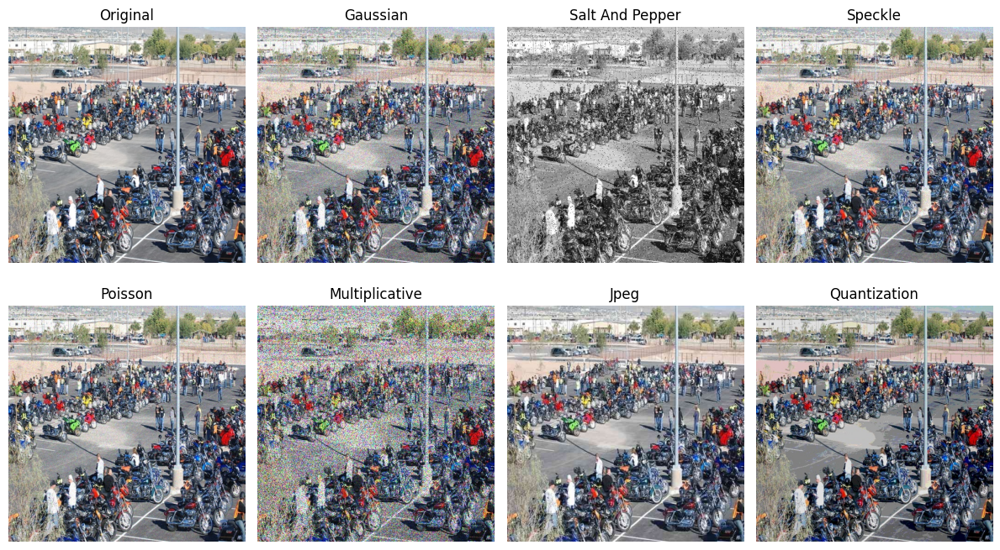

In [73]:
filename = os.listdir(original_path)[0]

original = cv2.cvtColor(cv2.imread(original_path + "/" + filename), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 7))

plt.subplot(2, 4, 1)
plt.imshow(original)
plt.title("Original")
plt.axis("off")

for i, noise_type in enumerate(noise_types):
    noisy = cv2.cvtColor(cv2.imread(noise_path + "/" + noise_type + "/" + filename), cv2.COLOR_BGR2RGB)
    plt.subplot(2, 4, i + 2)
    plt.imshow(noisy)
    plt.title(noise_type.replace("_", " ").title())
    plt.axis("off")

plt.tight_layout()
plt.show()
plt.close()

## 4. Selecting a Test Image

In this section, we select one original image and its corresponding Gaussian-noisy version for testing the denoising filters.

In [74]:
filename = os.listdir(original_path)[0]

original = cv2.imread(original_path + "/" + filename)
noisy = cv2.imread(noise_path + "/gaussian/" + filename)

original = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
noisy = cv2.cvtColor(noisy, cv2.COLOR_BGR2GRAY)

print("Image:", filename)
print("Image shape:", original.shape)

Image: 5237865515_8bbc650900_c.jpg
Image shape: (512, 512)


## 4. Applying Denoising Filters

In this section, four different denoising filters are applied to the same Gaussian-noisy image: Mean, Gaussian, Median, and Bilateral filters.

In [75]:
# Select Test Image

filename = os.listdir(original_path)[0]

original = cv2.imread(original_path + "/" + filename)
noisy = cv2.imread(noise_path + "/gaussian/" + filename)

original = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
noisy = cv2.cvtColor(noisy, cv2.COLOR_BGR2GRAY)

print("Image:", filename)
print("Image shape:", original.shape)


# Mean Filter

mean_3 = cv2.blur(noisy, (3, 3))
mean_5 = cv2.blur(noisy, (5, 5))
mean_7 = cv2.blur(noisy, (7, 7))


# Gaussian Filter

gaussian_3 = cv2.GaussianBlur(noisy, (3, 3), 0)
gaussian_5 = cv2.GaussianBlur(noisy, (5, 5), 0)
gaussian_7 = cv2.GaussianBlur(noisy, (7, 7), 0)


# Median Filter

median_3 = cv2.medianBlur(noisy, 3)
median_5 = cv2.medianBlur(noisy, 5)
median_7 = cv2.medianBlur(noisy, 7)


# Bilateral Filter

bilateral_3 = cv2.bilateralFilter(noisy, 3, 75, 75)
bilateral_5 = cv2.bilateralFilter(noisy, 5, 75, 75)
bilateral_7 = cv2.bilateralFilter(noisy, 7, 75, 75)

print("All filters were applied successfully.")

Image: 5237865515_8bbc650900_c.jpg
Image shape: (512, 512)
All filters were applied successfully.


## 5. Comparing Filters and Evaluating Image Quality

The filtered images are compared using different kernel sizes.
MSE, PSNR, and SSIM are also calculated to evaluate the results.

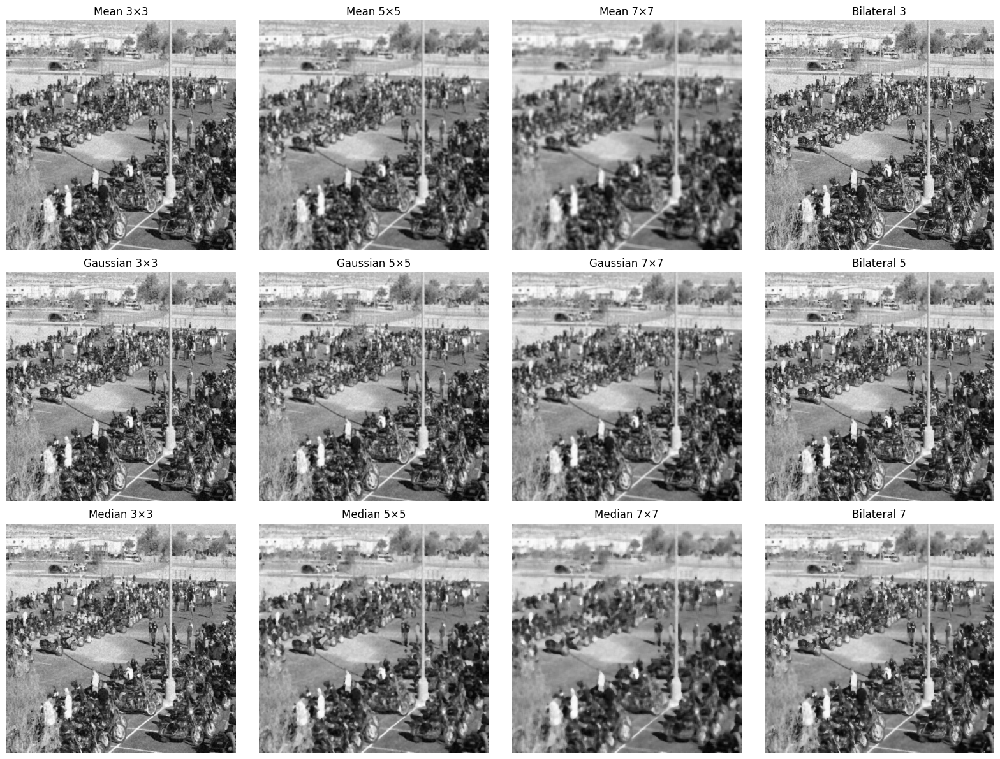

,Filter,MSE,PSNR,SSIM
0,Mean 3×3,473.452103,21.378043,0.711555
1,Mean 5×5,811.797798,19.036325,0.517181
2,Mean 7×7,1025.685482,18.020662,0.394693
3,Gaussian 3×3,320.676613,23.070131,0.794166
4,Gaussian 5×5,475.240902,21.361665,0.714133
5,Gaussian 7×7,652.819736,19.982871,0.611282
6,Median 3×3,454.518040,21.555292,0.712502
7,Median 5×5,768.572918,19.273953,0.540767
8,Median 7×7,980.646553,18.215679,0.424952
9,Bilateral 3,204.230190,25.029604,0.839669


In [76]:
# Show Filter Results

plt.figure(figsize=(16, 12))

# Mean
plt.subplot(3, 4, 1)
plt.imshow(mean_3, cmap="gray")
plt.title("Mean 3×3")
plt.axis("off")

plt.subplot(3, 4, 2)
plt.imshow(mean_5, cmap="gray")
plt.title("Mean 5×5")
plt.axis("off")

plt.subplot(3, 4, 3)
plt.imshow(mean_7, cmap="gray")
plt.title("Mean 7×7")
plt.axis("off")

# Gaussian
plt.subplot(3, 4, 5)
plt.imshow(gaussian_3, cmap="gray")
plt.title("Gaussian 3×3")
plt.axis("off")

plt.subplot(3, 4, 6)
plt.imshow(gaussian_5, cmap="gray")
plt.title("Gaussian 5×5")
plt.axis("off")

plt.subplot(3, 4, 7)
plt.imshow(gaussian_7, cmap="gray")
plt.title("Gaussian 7×7")
plt.axis("off")

# Median
plt.subplot(3, 4, 9)
plt.imshow(median_3, cmap="gray")
plt.title("Median 3×3")
plt.axis("off")

plt.subplot(3, 4, 10)
plt.imshow(median_5, cmap="gray")
plt.title("Median 5×5")
plt.axis("off")

plt.subplot(3, 4, 11)
plt.imshow(median_7, cmap="gray")
plt.title("Median 7×7")
plt.axis("off")

# Bilateral
plt.subplot(3, 4, 4)
plt.imshow(bilateral_3, cmap="gray")
plt.title("Bilateral 3")
plt.axis("off")

plt.subplot(3, 4, 8)
plt.imshow(bilateral_5, cmap="gray")
plt.title("Bilateral 5")
plt.axis("off")

plt.subplot(3, 4, 12)
plt.imshow(bilateral_7, cmap="gray")
plt.title("Bilateral 7")
plt.axis("off")

plt.tight_layout()
plt.show()
plt.close()


# Calculate Metrics

results = []

filters = {
    "Mean 3×3": mean_3,
    "Mean 5×5": mean_5,
    "Mean 7×7": mean_7,
    "Gaussian 3×3": gaussian_3,
    "Gaussian 5×5": gaussian_5,
    "Gaussian 7×7": gaussian_7,
    "Median 3×3": median_3,
    "Median 5×5": median_5,
    "Median 7×7": median_7,
    "Bilateral 3": bilateral_3,
    "Bilateral 5": bilateral_5,
    "Bilateral 7": bilateral_7
}

for name, image in filters.items():
    mse = mean_squared_error(original, image)
    psnr = peak_signal_noise_ratio(original, image, data_range=255)
    ssim = structural_similarity(original, image, data_range=255)
    
    results.append([name, mse, psnr, ssim])

results_df = pd.DataFrame(
    results,
    columns=["Filter", "MSE", "PSNR", "SSIM"]
)

results_df


## 6. Ranking and Selecting the Best Filter

The filters are ranked using PSNR.
The filter with the highest PSNR is selected as the best result.

In [77]:
# Sort Results

sorted_results = results_df.sort_values(
    by="PSNR",
    ascending=False
).reset_index(drop=True)

display(sorted_results)


# Find Best Filter

best_result = results_df.loc[
    results_df["PSNR"].idxmax()
]

print("Best Filter:", best_result["Filter"])
print("MSE:", round(best_result["MSE"], 4))
print("PSNR:", round(best_result["PSNR"], 2), "dB")
print("SSIM:", round(best_result["SSIM"], 4))

,Filter,MSE,PSNR,SSIM
0,Bilateral 3,204.230190,25.029604,0.839669
1,Bilateral 5,304.425159,23.295998,0.786222
2,Gaussian 3×3,320.676613,23.070131,0.794166
3,Bilateral 7,409.626827,22.006920,0.712151
4,Median 3×3,454.518040,21.555292,0.712502
5,Mean 3×3,473.452103,21.378043,0.711555
6,Gaussian 5×5,475.240902,21.361665,0.714133
7,Gaussian 7×7,652.819736,19.982871,0.611282
8,Median 5×5,768.572918,19.273953,0.540767
9,Mean 5×5,811.797798,19.036325,0.517181


Best Filter: Bilateral 3
MSE: 204.2302
PSNR: 25.03 dB
SSIM: 0.8397


## 7. Best Result Visualization

The original, noisy, and best filtered images are shown together for visual comparison.

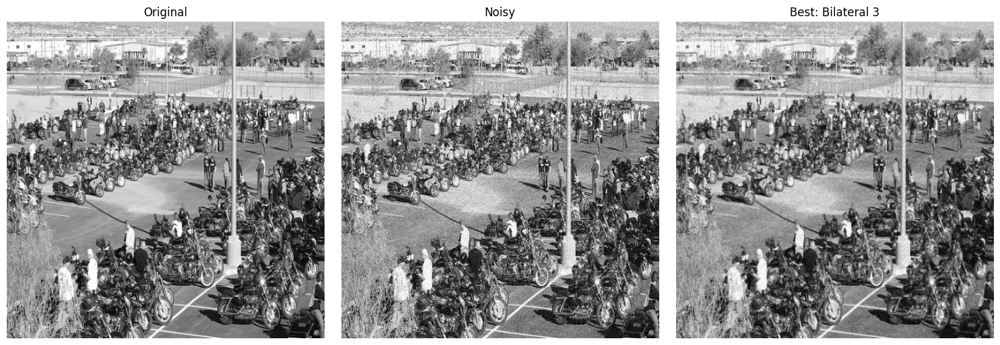

In [78]:
# Show Best Result

best_filter_name = best_result["Filter"]
best_image = filters[best_filter_name]

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(original, cmap="gray")
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(noisy, cmap="gray")
plt.title("Noisy")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(best_image, cmap="gray")
plt.title("Best: " + best_filter_name)
plt.axis("off")

plt.tight_layout()
plt.show()
plt.close()

## 8. Evaluating All 300 Images

In this section, the same filters are applied to all 300 images with Gaussian noise.

MSE, PSNR, and SSIM are calculated for each image and then averaged to compare the filters.

In [79]:
# Set Paths

original_folder = base_path + "/original"
gaussian_folder = base_path + "/noises/gaussian"

filenames = os.listdir(original_folder)

results_all = []

print("Number of images:", len(filenames))


# Process All Images

for filename in filenames:

    original_img = cv2.imread(original_folder + "/" + filename, cv2.IMREAD_GRAYSCALE)
    noisy_img = cv2.imread(gaussian_folder + "/" + filename, cv2.IMREAD_GRAYSCALE)

    if original_img is None or noisy_img is None:
        continue

    # Apply filters
    mean_3_img = cv2.blur(noisy_img, (3, 3))
    mean_5_img = cv2.blur(noisy_img, (5, 5))
    mean_7_img = cv2.blur(noisy_img, (7, 7))

    gaussian_3_img = cv2.GaussianBlur(noisy_img, (3, 3), 0)
    gaussian_5_img = cv2.GaussianBlur(noisy_img, (5, 5), 0)
    gaussian_7_img = cv2.GaussianBlur(noisy_img, (7, 7), 0)

    median_3_img = cv2.medianBlur(noisy_img, 3)
    median_5_img = cv2.medianBlur(noisy_img, 5)
    median_7_img = cv2.medianBlur(noisy_img, 7)

    bilateral_3_img = cv2.bilateralFilter(noisy_img, 3, 75, 75)
    bilateral_5_img = cv2.bilateralFilter(noisy_img, 5, 75, 75)
    bilateral_7_img = cv2.bilateralFilter(noisy_img, 7, 75, 75)

    images = {
        "Mean 3×3": mean_3_img,
        "Mean 5×5": mean_5_img,
        "Mean 7×7": mean_7_img,
        "Gaussian 3×3": gaussian_3_img,
        "Gaussian 5×5": gaussian_5_img,
        "Gaussian 7×7": gaussian_7_img,
        "Median 3×3": median_3_img,
        "Median 5×5": median_5_img,
        "Median 7×7": median_7_img,
        "Bilateral 3": bilateral_3_img,
        "Bilateral 5": bilateral_5_img,
        "Bilateral 7": bilateral_7_img
    }

    for name, filtered_img in images.items():

        mse = mean_squared_error(original_img, filtered_img)
        psnr = peak_signal_noise_ratio(
            original_img,
            filtered_img,
            data_range=255
        )
        ssim = structural_similarity(
            original_img,
            filtered_img,
            data_range=255
        )

        results_all.append([
            name,
            mse,
            psnr,
            ssim
        ])


results_300 = pd.DataFrame(
    results_all,
    columns=["Filter", "MSE", "PSNR", "SSIM"]
)

print("Evaluation completed.")

Number of images: 300
Evaluation completed.


## 9. Average Results for 300 Images

The average MSE, PSNR, and SSIM values are calculated for all filters.

In [80]:
# Calculate Average Results

average_results = results_300.groupby("Filter")[["MSE", "PSNR", "SSIM"]].mean()

average_results = average_results.sort_values(
    by="PSNR",
    ascending=False
)

display(average_results)

,MSE,PSNR,SSIM
Filter,,,
Bilateral 5,86.012039,29.626891,0.784553
Bilateral 7,105.639390,29.158363,0.799242
Gaussian 3×3,95.418357,28.988028,0.739919
Gaussian 5×5,113.645887,28.852728,0.780780
Bilateral 3,89.288879,28.843754,0.698533
Mean 3×3,117.522845,28.503871,0.741543
Median 3×3,119.427054,28.143097,0.692059
Gaussian 7×7,148.376950,28.115388,0.785786
Median 5×5,158.782989,27.852362,0.739655


## 10. Best Filter for Gaussian Noise

The filter with the highest average PSNR is selected as the best filter for Gaussian noise.

In [81]:
# Find Best Filter

best_filter = average_results.index[0]

print("Best Filter for Gaussian Noise:", best_filter)
print("Average MSE:", round(average_results.loc[best_filter, "MSE"], 4))
print("Average PSNR:", round(average_results.loc[best_filter, "PSNR"], 2), "dB")
print("Average SSIM:", round(average_results.loc[best_filter, "SSIM"], 4))

Best Filter for Gaussian Noise: Bilateral 5
Average MSE: 86.012
Average PSNR: 29.63 dB
Average SSIM: 0.7846


## 11. PSNR , SSIM and MSE Comparison


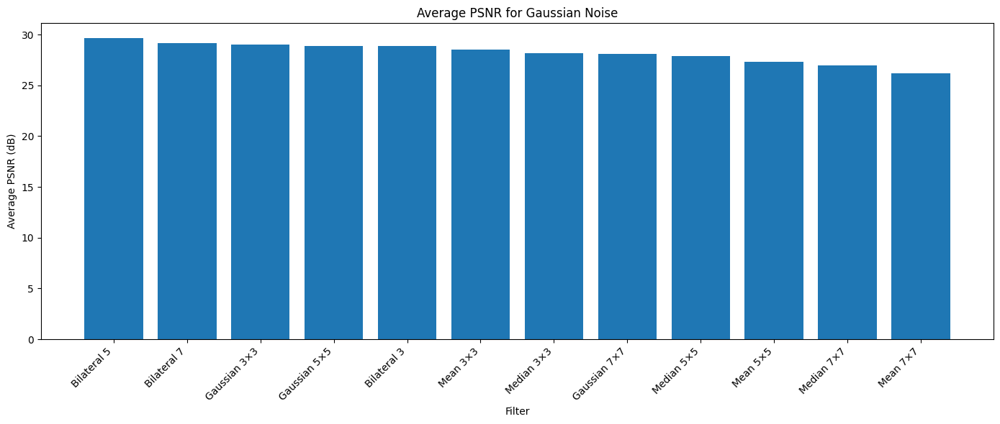

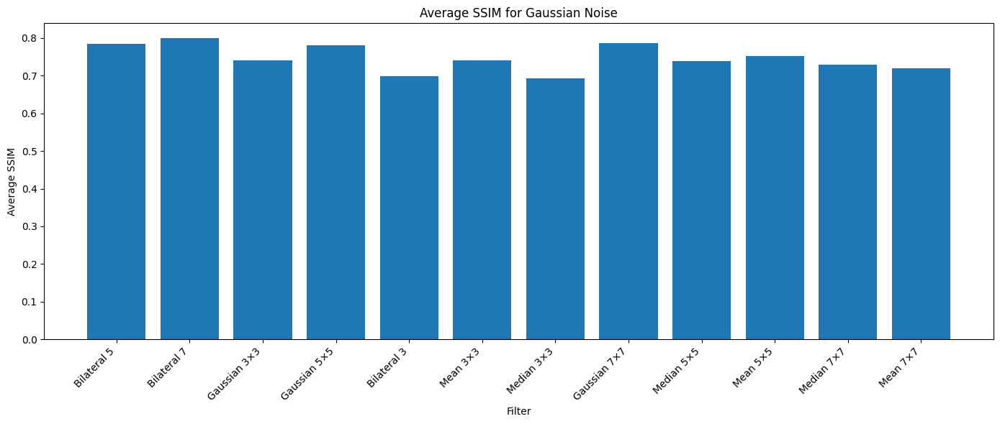

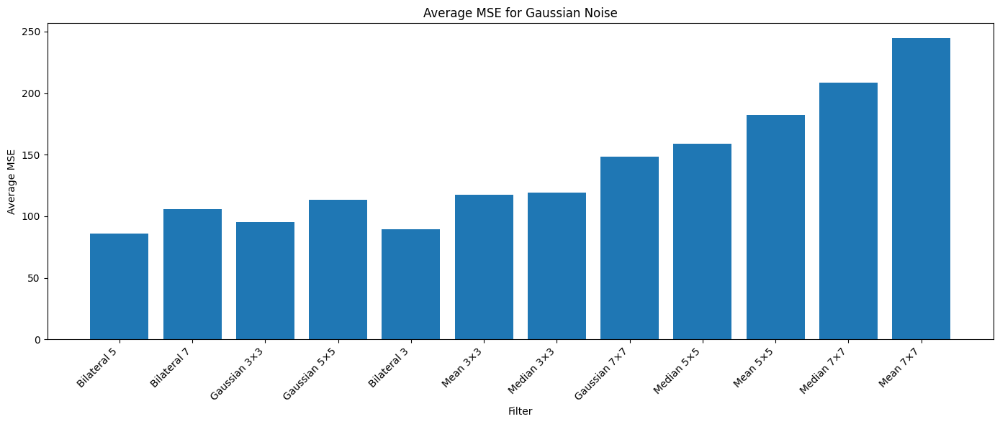

In [83]:
# PSNR, SSIM, and MSE Comparison

# PSNR Comparison
plt.figure(figsize=(14, 6))

plt.bar(average_results.index, average_results["PSNR"])

plt.xlabel("Filter")
plt.ylabel("Average PSNR (dB)")
plt.title("Average PSNR for Gaussian Noise")

plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()
plt.close()


# SSIM Comparison
plt.figure(figsize=(14, 6))

plt.bar(average_results.index, average_results["SSIM"])

plt.xlabel("Filter")
plt.ylabel("Average SSIM")
plt.title("Average SSIM for Gaussian Noise")

plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()
plt.close()


# MSE Comparison
plt.figure(figsize=(14, 6))

plt.bar(average_results.index, average_results["MSE"])

plt.xlabel("Filter")
plt.ylabel("Average MSE")
plt.title("Average MSE for Gaussian Noise")

plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()
plt.close()

## 12. Gaussian Noise Results and Visual Comparison

,MSE,PSNR,SSIM
Filter,,,
Bilateral 5,86.0120,29.6269,0.7846
Bilateral 7,105.6394,29.1584,0.7992
Gaussian 3×3,95.4184,28.9880,0.7399
Gaussian 5×5,113.6459,28.8527,0.7808
Bilateral 3,89.2889,28.8438,0.6985
Mean 3×3,117.5228,28.5039,0.7415
Median 3×3,119.4271,28.1431,0.6921
Gaussian 7×7,148.3769,28.1154,0.7858
Median 5×5,158.7830,27.8524,0.7397


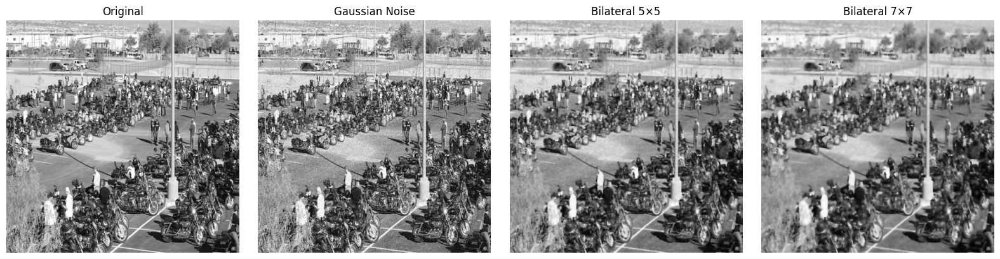

In [85]:
# Show Gaussian Results

display(average_results.round(4))

# Show Gaussian Results

plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
plt.imshow(original, cmap="gray")
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(noisy, cmap="gray")
plt.title("Gaussian Noise")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(filters["Bilateral 5"], cmap="gray")
plt.title("Bilateral 5×5")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(filters["Bilateral 7"], cmap="gray")
plt.title("Bilateral 7×7")
plt.axis("off")

plt.tight_layout()
plt.show()
plt.close()

## 13. Gaussian Noise Results

Gaussian noise was evaluated using four spatial denoising filters: Mean,
Gaussian, Median, and Bilateral filters. Each filter was tested with
different kernel sizes (3×3, 5×5, and 7×7).

The filters were evaluated on 300 images using three metrics:
MSE, PSNR, and SSIM.

- Lower MSE indicates lower reconstruction error.
- Higher PSNR indicates better image quality.
- Higher SSIM indicates better structural similarity.

### Best Results

The **Bilateral 5×5** filter achieved the best overall performance.

- **MSE:** 86.0120 → lowest error
- **PSNR:** 29.6269 dB → highest PSNR
- **SSIM:** 0.7846

The **Bilateral 7×7** filter achieved the highest SSIM:

- **SSIM:** 0.7992

This means that Bilateral 7×7 preserved the image structure slightly
better, while Bilateral 5×5 provided the best overall balance between
noise reduction and image quality.

### Conclusion

For the Gaussian noise in this dataset, the **Bilateral 5×5** filter
was selected as the best overall filter because it achieved the lowest
MSE and the highest PSNR. Increasing the kernel size did not always
improve the result. In this experiment, the 7×7 filters generally
produced more smoothing and loss of fine details.

The visual comparison also showed that Bilateral filtering reduced
Gaussian noise while preserving important image edges better than
stronger smoothing with a larger kernel.


## 14. Salt and Pepper Noise

In [86]:
# Select Image

salt_pepper_path = base_path + "/noises/salt_and_pepper"

filename = os.listdir(original_folder)[0]

original = cv2.imread(original_folder + "/" + filename, cv2.IMREAD_GRAYSCALE)
noisy = cv2.imread(salt_pepper_path + "/" + filename, cv2.IMREAD_GRAYSCALE)

print("Image:", filename)
print("Image shape:", original.shape)


# Apply Filters

mean_3 = cv2.blur(noisy, (3, 3))
mean_5 = cv2.blur(noisy, (5, 5))
mean_7 = cv2.blur(noisy, (7, 7))

gaussian_3 = cv2.GaussianBlur(noisy, (3, 3), 0)
gaussian_5 = cv2.GaussianBlur(noisy, (5, 5), 0)
gaussian_7 = cv2.GaussianBlur(noisy, (7, 7), 0)

median_3 = cv2.medianBlur(noisy, 3)
median_5 = cv2.medianBlur(noisy, 5)
median_7 = cv2.medianBlur(noisy, 7)

bilateral_3 = cv2.bilateralFilter(noisy, 3, 75, 75)
bilateral_5 = cv2.bilateralFilter(noisy, 5, 75, 75)
bilateral_7 = cv2.bilateralFilter(noisy, 7, 75, 75)

print("All filters were applied successfully.")

Image: 5237865515_8bbc650900_c.jpg
Image shape: (512, 512)
All filters were applied successfully.


## 15. Salt and Pepper Results

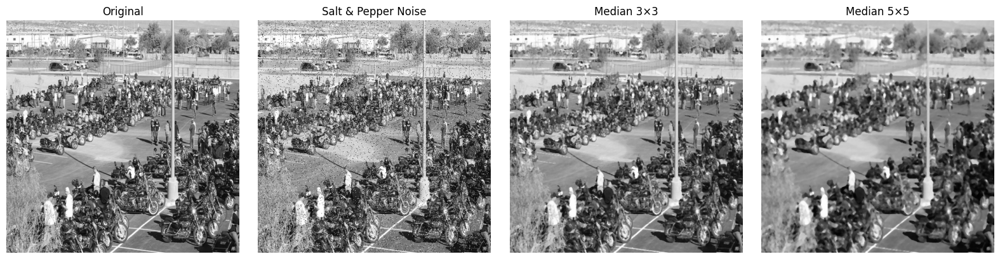

In [87]:
# Show Results

plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
plt.imshow(original, cmap="gray")
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(noisy, cmap="gray")
plt.title("Salt & Pepper Noise")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(median_3, cmap="gray")
plt.title("Median 3×3")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(median_5, cmap="gray")
plt.title("Median 5×5")
plt.axis("off")

plt.tight_layout()
plt.show()
plt.close()

## 16. Evaluating All 300 Images

The same denoising filters are evaluated on all 300 Salt and Pepper noise images.
MSE, PSNR, and SSIM are calculated for comparison.

In [88]:
# Evaluate All Images

results_sp = []

filenames = os.listdir(original_folder)

for filename in filenames:

    original_img = cv2.imread(original_folder + "/" + filename, cv2.IMREAD_GRAYSCALE)
    noisy_img = cv2.imread(salt_pepper_path + "/" + filename, cv2.IMREAD_GRAYSCALE)

    if original_img is None or noisy_img is None:
        continue

    filters_sp = {
        "Mean 3×3": cv2.blur(noisy_img, (3, 3)),
        "Mean 5×5": cv2.blur(noisy_img, (5, 5)),
        "Mean 7×7": cv2.blur(noisy_img, (7, 7)),
        "Gaussian 3×3": cv2.GaussianBlur(noisy_img, (3, 3), 0),
        "Gaussian 5×5": cv2.GaussianBlur(noisy_img, (5, 5), 0),
        "Gaussian 7×7": cv2.GaussianBlur(noisy_img, (7, 7), 0),
        "Median 3×3": cv2.medianBlur(noisy_img, 3),
        "Median 5×5": cv2.medianBlur(noisy_img, 5),
        "Median 7×7": cv2.medianBlur(noisy_img, 7),
        "Bilateral 3": cv2.bilateralFilter(noisy_img, 3, 75, 75),
        "Bilateral 5": cv2.bilateralFilter(noisy_img, 5, 75, 75),
        "Bilateral 7": cv2.bilateralFilter(noisy_img, 7, 75, 75)
    }

    for name, filtered_img in filters_sp.items():

        mse = mean_squared_error(original_img, filtered_img)
        psnr = peak_signal_noise_ratio(original_img, filtered_img, data_range=255)
        ssim = structural_similarity(original_img, filtered_img, data_range=255)

        results_sp.append([name, mse, psnr, ssim])

results_sp_df = pd.DataFrame(
    results_sp,
    columns=["Filter", "MSE", "PSNR", "SSIM"]
)

print("Evaluation completed.")
print("Images processed:", len(filenames))

Evaluation completed.
Images processed: 300


## 17. Average Results and Best Filter

The average MSE, PSNR, and SSIM values are calculated for all filters.
The best filter is identified using all three metrics.

In [89]:
# Calculate Average Results

average_sp = results_sp_df.groupby("Filter")[["MSE", "PSNR", "SSIM"]].mean()
average_sp = average_sp.sort_values(by="PSNR", ascending=False)

display(average_sp.round(4))


# Find Best Filters

best_sp_psnr = average_sp["PSNR"].idxmax()
best_sp_ssim = average_sp["SSIM"].idxmax()
best_sp_mse = average_sp["MSE"].idxmin()

print("Best PSNR:", best_sp_psnr)
print("Best SSIM:", best_sp_ssim)
print("Best MSE:", best_sp_mse)

,MSE,PSNR,SSIM
Filter,,,
Median 3×3,68.8100,32.9511,0.9202
Median 5×5,135.1151,29.8222,0.8514
Median 7×7,193.4773,28.0199,0.7989
Gaussian 7×7,185.3297,26.4878,0.6908
Gaussian 5×5,176.0060,26.2355,0.6429
Mean 5×5,218.3223,25.9160,0.6560
Mean 7×7,266.4751,25.3973,0.6689
Mean 3×3,206.5301,25.3728,0.5833
Gaussian 3×3,206.5948,25.1723,0.5779


Best PSNR: Median 3×3
Best SSIM: Median 3×3
Best MSE: Median 3×3


## 18. PSNR, SSIM and MSE Comparison

The average PSNR, SSIM, and MSE values are compared across all filters.
Higher PSNR and SSIM are better, while lower MSE is better.

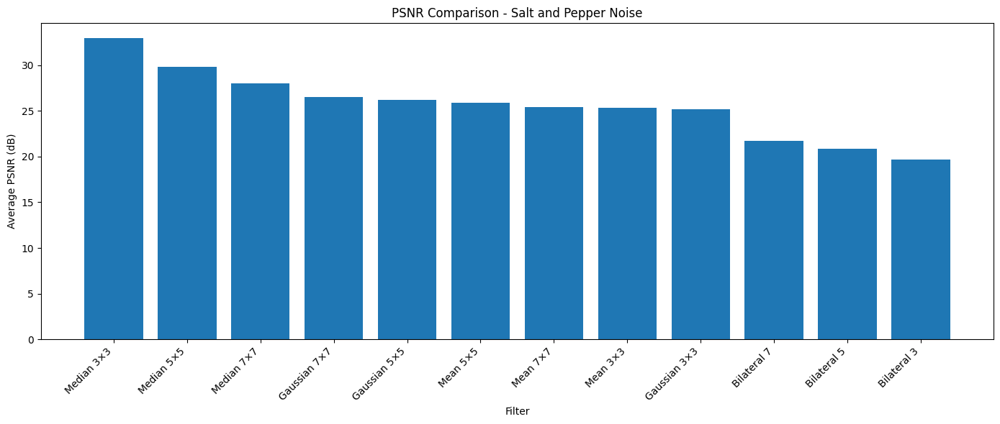

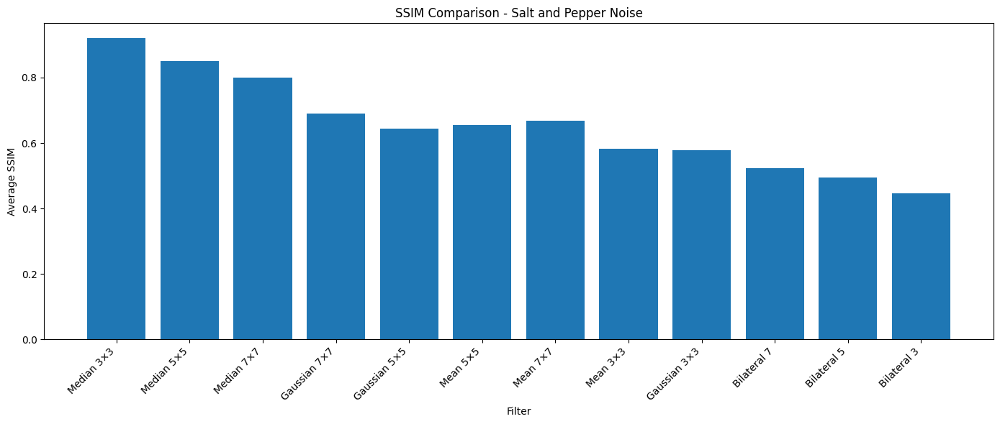

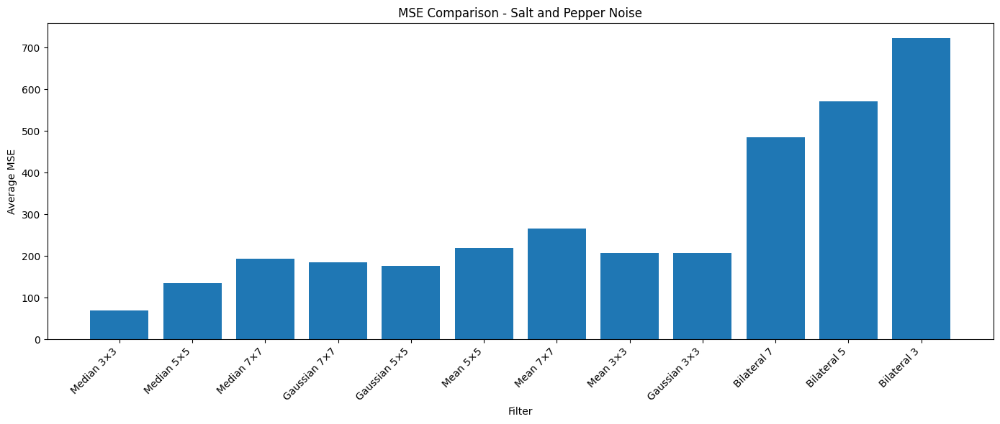

In [91]:
# PSNR Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_sp.index, average_sp["PSNR"])
plt.xlabel("Filter")
plt.ylabel("Average PSNR (dB)")
plt.title("PSNR Comparison - Salt and Pepper Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


# SSIM Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_sp.index, average_sp["SSIM"])
plt.xlabel("Filter")
plt.ylabel("Average SSIM")
plt.title("SSIM Comparison - Salt and Pepper Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


# MSE Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_sp.index, average_sp["MSE"])
plt.xlabel("Filter")
plt.ylabel("Average MSE")
plt.title("MSE Comparison - Salt and Pepper Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()

## 19. Show Salt and Pepper Results

,MSE,PSNR,SSIM
Filter,,,
Median 3×3,68.8100,32.9511,0.9202
Median 5×5,135.1151,29.8222,0.8514
Median 7×7,193.4773,28.0199,0.7989
Gaussian 7×7,185.3297,26.4878,0.6908
Gaussian 5×5,176.0060,26.2355,0.6429
Mean 5×5,218.3223,25.9160,0.6560
Mean 7×7,266.4751,25.3973,0.6689
Mean 3×3,206.5301,25.3728,0.5833
Gaussian 3×3,206.5948,25.1723,0.5779


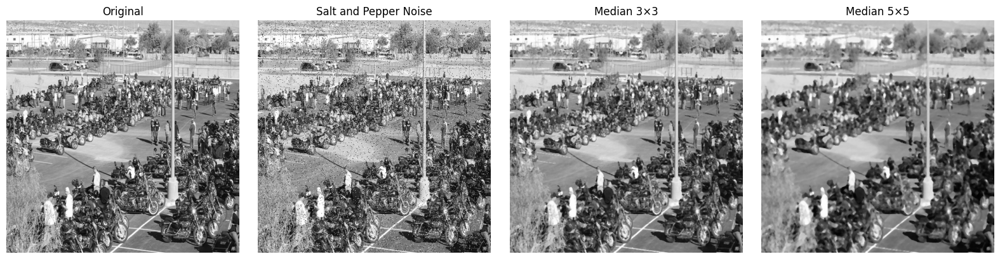

In [92]:
# Show Salt and Pepper Results

filename = os.listdir(original_folder)[0]

original = cv2.imread(original_folder + "/" + filename, cv2.IMREAD_GRAYSCALE)
noisy = cv2.imread(salt_pepper_path + "/" + filename, cv2.IMREAD_GRAYSCALE)


# Apply Median Filters

median_3 = cv2.medianBlur(noisy, 3)
median_5 = cv2.medianBlur(noisy, 5)


# Show Results

display(average_sp.round(4))

plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
plt.imshow(original, cmap="gray")
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(noisy, cmap="gray")
plt.title("Salt and Pepper Noise")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(median_3, cmap="gray")
plt.title("Median 3×3")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(median_5, cmap="gray")
plt.title("Median 5×5")
plt.axis("off")

plt.tight_layout()
plt.show()
plt.close()

## 20.Salt and Pepper Noise Results

Salt and Pepper noise was tested using Mean, Gaussian, Median, and Bilateral filters with different kernel sizes.

The results were evaluated using MSE, PSNR, and SSIM.

- Lower MSE means lower error.
- Higher PSNR means better image quality.
- Higher SSIM means better structural similarity.

### Best Result

The **Median 3×3** filter achieved the best overall performance.

- **MSE:** 68.8100
- **PSNR:** 32.9511 dB
- **SSIM:** 0.9202

Median 3×3 achieved the lowest MSE, the highest PSNR, and the highest SSIM among all tested filters.

The Median filter performed much better than the other filters for Salt and Pepper noise. This can also be seen in the visual results, where most of the noise is removed while the main image details are preserved.

Increasing the Median filter size from 3×3 to 5×5 and 7×7 reduced the performance. This shows that larger kernels can remove more image details and cause more smoothing.

### Conclusion

For Salt and Pepper noise, **Median 3×3** was the best filter in this experiment.

It provided the best balance between noise removal and preservation of image structure.

Therefore, **Median 3×3 is selected as the best filter for Salt and Pepper noise.**

## 21. Poisson Noise

In [94]:
# Select Poisson Image

poisson_path = base_path + "/noises/poisson"

filename = os.listdir(original_folder)[0]

original = cv2.imread(original_folder + "/" + filename, cv2.IMREAD_GRAYSCALE)
noisy = cv2.imread(poisson_path + "/" + filename, cv2.IMREAD_GRAYSCALE)

print("Image:", filename)
print("Image shape:", original.shape)


# Apply Filters

mean_3 = cv2.blur(noisy, (3, 3))
mean_5 = cv2.blur(noisy, (5, 5))
mean_7 = cv2.blur(noisy, (7, 7))

gaussian_3 = cv2.GaussianBlur(noisy, (3, 3), 0)
gaussian_5 = cv2.GaussianBlur(noisy, (5, 5), 0)
gaussian_7 = cv2.GaussianBlur(noisy, (7, 7), 0)

median_3 = cv2.medianBlur(noisy, 3)
median_5 = cv2.medianBlur(noisy, 5)
median_7 = cv2.medianBlur(noisy, 7)

bilateral_3 = cv2.bilateralFilter(noisy, 3, 75, 75)
bilateral_5 = cv2.bilateralFilter(noisy, 5, 75, 75)
bilateral_7 = cv2.bilateralFilter(noisy, 7, 75, 75)

print("All filters were applied successfully.")

Image: 5237865515_8bbc650900_c.jpg
Image shape: (512, 512)
All filters were applied successfully.


## 22. Evaluate Poisson Noise

In [96]:
# Evaluate All Images

results_poisson = []

filenames = os.listdir(original_folder)

for filename in filenames:

    original_img = cv2.imread(
        original_folder + "/" + filename,
        cv2.IMREAD_GRAYSCALE
    )

    noisy_img = cv2.imread(
        poisson_path + "/" + filename,
        cv2.IMREAD_GRAYSCALE
    )

    if original_img is None or noisy_img is None:
        continue

    filters_poisson = {
        "Mean 3×3": cv2.blur(noisy_img, (3, 3)),
        "Mean 5×5": cv2.blur(noisy_img, (5, 5)),
        "Mean 7×7": cv2.blur(noisy_img, (7, 7)),

        "Gaussian 3×3": cv2.GaussianBlur(noisy_img, (3, 3), 0),
        "Gaussian 5×5": cv2.GaussianBlur(noisy_img, (5, 5), 0),
        "Gaussian 7×7": cv2.GaussianBlur(noisy_img, (7, 7), 0),

        "Median 3×3": cv2.medianBlur(noisy_img, 3),
        "Median 5×5": cv2.medianBlur(noisy_img, 5),
        "Median 7×7": cv2.medianBlur(noisy_img, 7),

        "Bilateral 3": cv2.bilateralFilter(noisy_img, 3, 75, 75),
        "Bilateral 5": cv2.bilateralFilter(noisy_img, 5, 75, 75),
        "Bilateral 7": cv2.bilateralFilter(noisy_img, 7, 75, 75)
    }

    for name, filtered_img in filters_poisson.items():

        mse = mean_squared_error(original_img, filtered_img)

        psnr = peak_signal_noise_ratio(
            original_img,
            filtered_img,
            data_range=255
        )

        ssim = structural_similarity(
            original_img,
            filtered_img,
            data_range=255
        )

        results_poisson.append([
            name,
            mse,
            psnr,
            ssim
        ])


results_poisson_df = pd.DataFrame(
    results_poisson,
    columns=["Filter", "MSE", "PSNR", "SSIM"]
)

print("Evaluation completed.")
print("Images processed:", len(filenames))

Evaluation completed.
Images processed: 300


## 23. Poisson Noise Average Results

In [102]:
# Calculate Average Results

average_poisson = results_poisson_df.groupby(
    "Filter"
)[["MSE", "PSNR", "SSIM"]].mean()

average_poisson = average_poisson.sort_values(
    by="PSNR",
    ascending=False
)


# Find Best Filters

best_poisson_psnr = average_poisson["PSNR"].idxmax()
best_poisson_ssim = average_poisson["SSIM"].idxmax()
best_poisson_mse = average_poisson["MSE"].idxmin()

print("Best PSNR:", best_poisson_psnr)
print("Best SSIM:", best_poisson_ssim)
print("Best MSE:", best_poisson_mse)

Best PSNR: Bilateral 3
Best SSIM: Gaussian 3×3
Best MSE: Bilateral 3


## 24.Show Poisson Results

,MSE,PSNR,SSIM
Filter,,,
Bilateral 3,38.6359,33.3388,0.8942
Gaussian 3×3,56.8017,32.4533,0.9006
Bilateral 5,61.6342,31.9895,0.8896
Median 3×3,74.3510,31.5001,0.8676
Mean 3×3,85.1585,31.0769,0.8785
Gaussian 5×5,88.3287,30.9468,0.8858
Bilateral 7,89.3568,30.5191,0.8562
Gaussian 7×7,129.7591,29.3529,0.8523
Median 5×5,137.6394,29.3426,0.8300


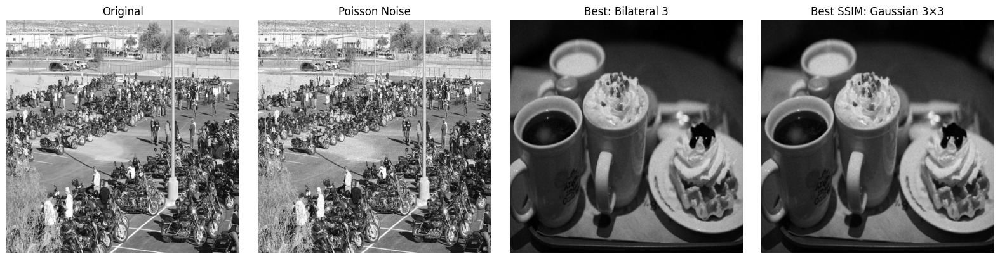

In [104]:
# Show Poisson Results

display(average_poisson.round(4))


plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
plt.imshow(original, cmap="gray")
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(noisy, cmap="gray")
plt.title("Poisson Noise")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(filters_poisson[best_poisson_psnr], cmap="gray")
plt.title("Best: " + best_poisson_psnr)
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(filters_poisson[best_poisson_ssim], cmap="gray")
plt.title("Best SSIM: " + best_poisson_ssim)
plt.axis("off")

plt.tight_layout()
plt.show()
plt.close()

## 25. Poisson Results

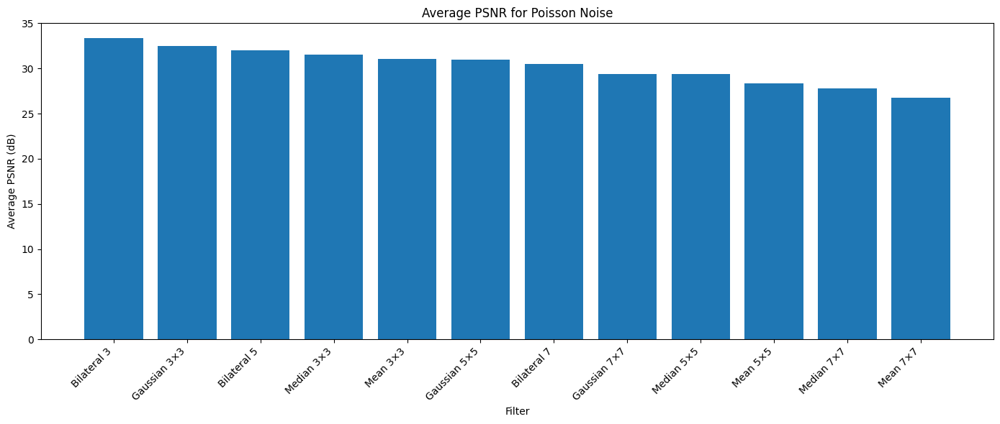

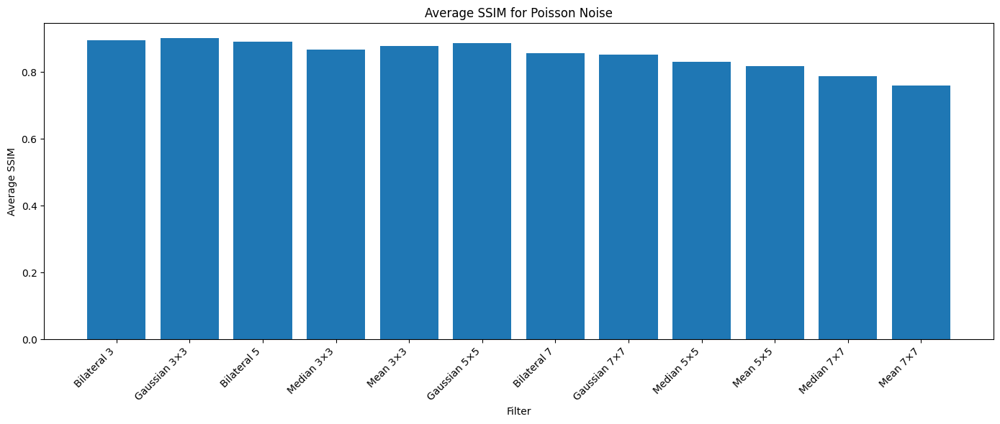

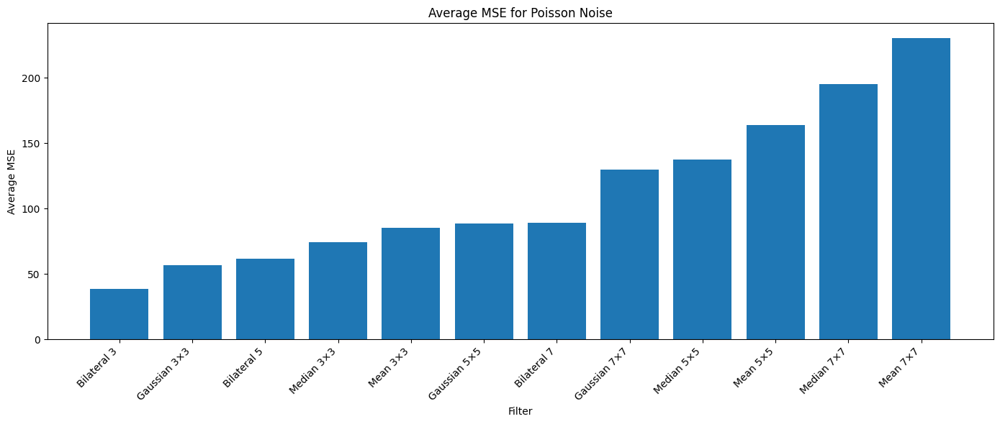

In [105]:
# Poisson Results

plt.figure(figsize=(14, 6))
plt.bar(average_poisson.index, average_poisson["PSNR"])
plt.xlabel("Filter")
plt.ylabel("Average PSNR (dB)")
plt.title("Average PSNR for Poisson Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


plt.figure(figsize=(14, 6))
plt.bar(average_poisson.index, average_poisson["SSIM"])
plt.xlabel("Filter")
plt.ylabel("Average SSIM")
plt.title("Average SSIM for Poisson Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


plt.figure(figsize=(14, 6))
plt.bar(average_poisson.index, average_poisson["MSE"])
plt.xlabel("Filter")
plt.ylabel("Average MSE")
plt.title("Average MSE for Poisson Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()

## 26.Poisson Noise Results

The results show that the Bilateral 3 filter achieved the highest PSNR
and the lowest MSE among the tested filters, with a PSNR of 33.3388 dB
and an MSE of 38.6359.

The Gaussian 3×3 filter achieved the highest SSIM value of 0.9006,
showing strong structural similarity with the original images.

Overall, the results indicate that smaller filter sizes performed better
for Poisson noise in this experiment. The best filter depends on the
evaluation metric used.

## 27. JPEG Noise Evaluation

In [106]:
# Select JPEG Noise

jpeg_path = base_path + "/noises/jpeg"

filename = os.listdir(original_folder)[0]

original = cv2.imread(
    original_folder + "/" + filename,
    cv2.IMREAD_GRAYSCALE
)

noisy = cv2.imread(
    jpeg_path + "/" + filename,
    cv2.IMREAD_GRAYSCALE
)

print("Image:", filename)
print("Image shape:", original.shape)


# Evaluate All Images

results_jpeg = []

filenames = os.listdir(original_folder)

for filename in filenames:

    original_img = cv2.imread(
        original_folder + "/" + filename,
        cv2.IMREAD_GRAYSCALE
    )

    noisy_img = cv2.imread(
        jpeg_path + "/" + filename,
        cv2.IMREAD_GRAYSCALE
    )

    if original_img is None or noisy_img is None:
        continue

    # Apply Filters

    filters_jpeg = {
        "Mean 3×3": cv2.blur(noisy_img, (3, 3)),
        "Mean 5×5": cv2.blur(noisy_img, (5, 5)),
        "Mean 7×7": cv2.blur(noisy_img, (7, 7)),

        "Gaussian 3×3": cv2.GaussianBlur(noisy_img, (3, 3), 0),
        "Gaussian 5×5": cv2.GaussianBlur(noisy_img, (5, 5), 0),
        "Gaussian 7×7": cv2.GaussianBlur(noisy_img, (7, 7), 0),

        "Median 3×3": cv2.medianBlur(noisy_img, 3),
        "Median 5×5": cv2.medianBlur(noisy_img, 5),
        "Median 7×7": cv2.medianBlur(noisy_img, 7),

        "Bilateral 3": cv2.bilateralFilter(noisy_img, 3, 75, 75),
        "Bilateral 5": cv2.bilateralFilter(noisy_img, 5, 75, 75),
        "Bilateral 7": cv2.bilateralFilter(noisy_img, 7, 75, 75)
    }

    for name, filtered_img in filters_jpeg.items():

        mse = mean_squared_error(
            original_img,
            filtered_img
        )

        psnr = peak_signal_noise_ratio(
            original_img,
            filtered_img,
            data_range=255
        )

        ssim = structural_similarity(
            original_img,
            filtered_img,
            data_range=255
        )

        results_jpeg.append([
            name,
            mse,
            psnr,
            ssim
        ])

    if (filenames.index(filename) + 1) % 25 == 0:
        print("Processed:", filenames.index(filename) + 1)


# Create Results Table

results_jpeg_df = pd.DataFrame(
    results_jpeg,
    columns=["Filter", "MSE", "PSNR", "SSIM"]
)


# Calculate Average Results

average_jpeg = results_jpeg_df.groupby(
    "Filter"
)[["MSE", "PSNR", "SSIM"]].mean()

average_jpeg = average_jpeg.sort_values(
    by="PSNR",
    ascending=False
)


# Find Best Filters

best_jpeg_psnr = average_jpeg["PSNR"].idxmax()
best_jpeg_ssim = average_jpeg["SSIM"].idxmax()
best_jpeg_mse = average_jpeg["MSE"].idxmin()


# Show Results

display(average_jpeg.round(4))

print("Best PSNR:", best_jpeg_psnr)
print("Best SSIM:", best_jpeg_ssim)
print("Best MSE:", best_jpeg_mse)

Image: 5237865515_8bbc650900_c.jpg
Image shape: (512, 512)
Processed: 25
Processed: 50
Processed: 75
Processed: 100
Processed: 125
Processed: 150
Processed: 175
Processed: 200
Processed: 225
Processed: 250
Processed: 275
Processed: 300


,MSE,PSNR,SSIM
Filter,,,
Bilateral 3,44.0468,33.6822,0.9243
Gaussian 3×3,60.7509,32.6317,0.9148
Median 3×3,70.0382,32.3482,0.9046
Bilateral 5,67.0577,32.0291,0.8978
Mean 3×3,81.8628,31.5731,0.8987
Gaussian 5×5,89.6244,31.0722,0.8904
Bilateral 7,99.2760,30.2593,0.8516
Median 5×5,132.9220,29.7139,0.8458
Gaussian 7×7,130.0571,29.4280,0.8530


Best PSNR: Bilateral 3
Best SSIM: Bilateral 3
Best MSE: Bilateral 3


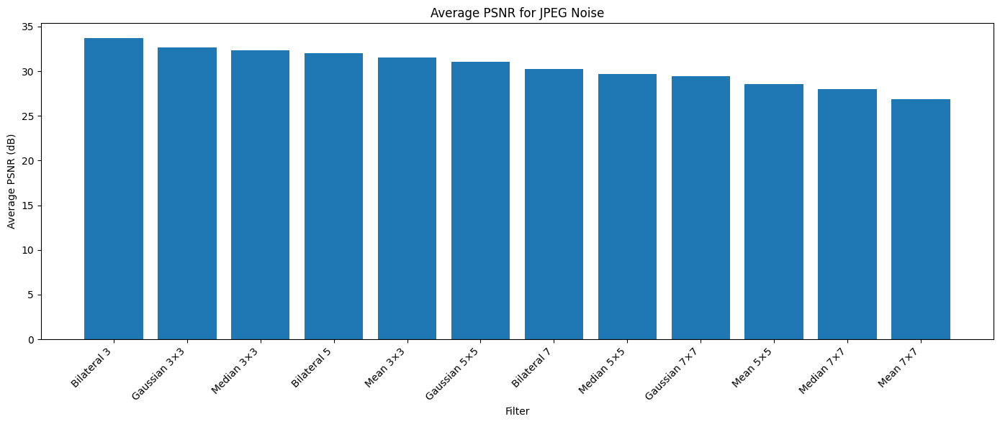

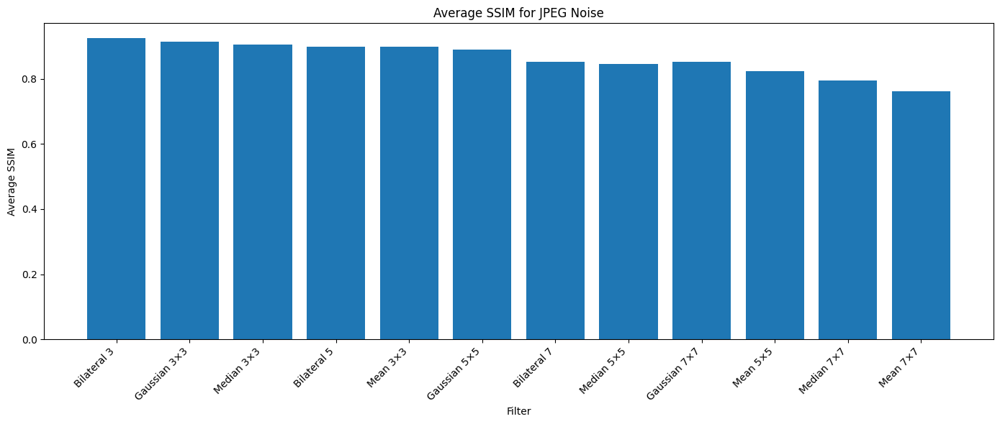

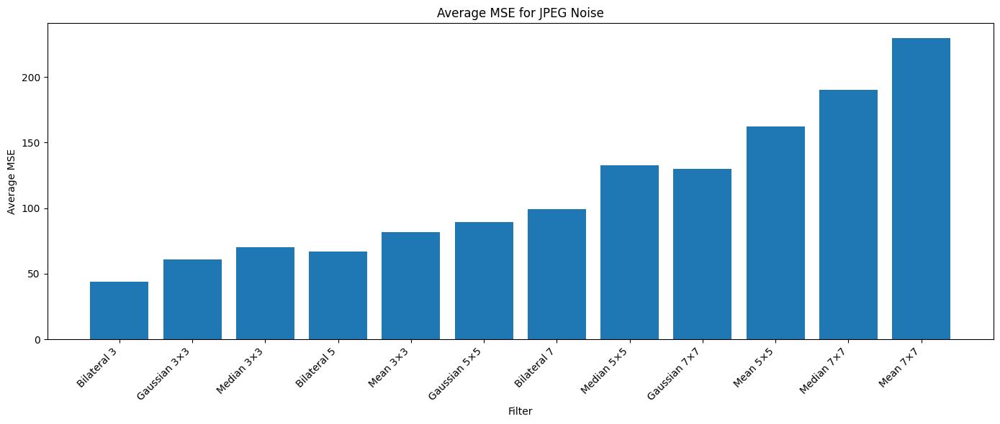

In [108]:
# PSNR Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_jpeg.index, average_jpeg["PSNR"])
plt.xlabel("Filter")
plt.ylabel("Average PSNR (dB)")
plt.title("Average PSNR for JPEG Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


# SSIM Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_jpeg.index, average_jpeg["SSIM"])
plt.xlabel("Filter")
plt.ylabel("Average SSIM")
plt.title("Average SSIM for JPEG Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


# MSE Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_jpeg.index, average_jpeg["MSE"])
plt.xlabel("Filter")
plt.ylabel("Average MSE")
plt.title("Average MSE for JPEG Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()

## 28.JPEG Noise Results

The results show that the Bilateral 3×3 filter achieved the best overall performance for JPEG noise.

- **Best PSNR:** Bilateral 3×3 → 33.6822 dB
- **Best SSIM:** Bilateral 3×3 → 0.9243
- **Best MSE:** Bilateral 3×3 → 44.0468

The Bilateral 3×3 filter provided the best results across all three evaluation metrics. Smaller filter sizes generally preserved image details better, while larger filters resulted in lower PSNR and SSIM and higher MSE.

## 29. Speckle Noise Evaluation

In [109]:
# Select Speckle Noise

speckle_path = base_path + "/noises/speckle"

filenames = os.listdir(original_folder)

results_speckle = []

# Process All Images

for i, filename in enumerate(filenames):

    original_img = cv2.imread(
        original_folder + "/" + filename,
        cv2.IMREAD_GRAYSCALE
    )

    noisy_img = cv2.imread(
        speckle_path + "/" + filename,
        cv2.IMREAD_GRAYSCALE
    )

    if original_img is None or noisy_img is None:
        continue


    # Apply Filters

    filters_speckle = {
        "Mean 3×3": cv2.blur(noisy_img, (3, 3)),
        "Mean 5×5": cv2.blur(noisy_img, (5, 5)),
        "Mean 7×7": cv2.blur(noisy_img, (7, 7)),

        "Gaussian 3×3": cv2.GaussianBlur(noisy_img, (3, 3), 0),
        "Gaussian 5×5": cv2.GaussianBlur(noisy_img, (5, 5), 0),
        "Gaussian 7×7": cv2.GaussianBlur(noisy_img, (7, 7), 0),

        "Median 3×3": cv2.medianBlur(noisy_img, 3),
        "Median 5×5": cv2.medianBlur(noisy_img, 5),
        "Median 7×7": cv2.medianBlur(noisy_img, 7),

        "Bilateral 3": cv2.bilateralFilter(noisy_img, 3, 75, 75),
        "Bilateral 5": cv2.bilateralFilter(noisy_img, 5, 75, 75),
        "Bilateral 7": cv2.bilateralFilter(noisy_img, 7, 75, 75)
    }


    # Calculate Metrics

    for name, filtered_img in filters_speckle.items():

        mse = mean_squared_error(
            original_img,
            filtered_img
        )

        psnr = peak_signal_noise_ratio(
            original_img,
            filtered_img,
            data_range=255
        )

        ssim = structural_similarity(
            original_img,
            filtered_img,
            data_range=255
        )

        results_speckle.append([
            name,
            mse,
            psnr,
            ssim
        ])


    # Show Progress

    if (i + 1) % 25 == 0:
        print("Processed:", i + 1)


# Create Results Table

results_speckle_df = pd.DataFrame(
    results_speckle,
    columns=["Filter", "MSE", "PSNR", "SSIM"]
)


# Calculate Average Results

average_speckle = results_speckle_df.groupby(
    "Filter"
)[["MSE", "PSNR", "SSIM"]].mean()

average_speckle = average_speckle.sort_values(
    by="PSNR",
    ascending=False
)


# Find Best Filters

best_speckle_psnr = average_speckle["PSNR"].idxmax()
best_speckle_ssim = average_speckle["SSIM"].idxmax()
best_speckle_mse = average_speckle["MSE"].idxmin()


# Show Final Results

print("Evaluation completed.")
print("Images processed:", len(results_speckle_df) // 12)

display(average_speckle.round(4))

print("Best PSNR:", best_speckle_psnr)
print("Best SSIM:", best_speckle_ssim)
print("Best MSE:", best_speckle_mse)

Processed: 25
Processed: 50
Processed: 75
Processed: 100
Processed: 125
Processed: 150
Processed: 175
Processed: 200
Processed: 225
Processed: 250
Processed: 275
Processed: 300
Evaluation completed.
Images processed: 300


,MSE,PSNR,SSIM
Filter,,,
Bilateral 3,45.5264,32.5218,0.8722
Gaussian 3×3,62.3142,31.8541,0.8826
Bilateral 5,66.1696,31.5478,0.8787
Median 3×3,79.9006,30.9664,0.8480
Mean 3×3,90.0266,30.6518,0.8635
Gaussian 5×5,92.5936,30.5934,0.8750
Bilateral 7,93.2463,30.2479,0.8511
Gaussian 7×7,133.4502,29.1407,0.8465
Median 5×5,140.7510,29.1206,0.8214


Best PSNR: Bilateral 3
Best SSIM: Gaussian 3×3
Best MSE: Bilateral 3


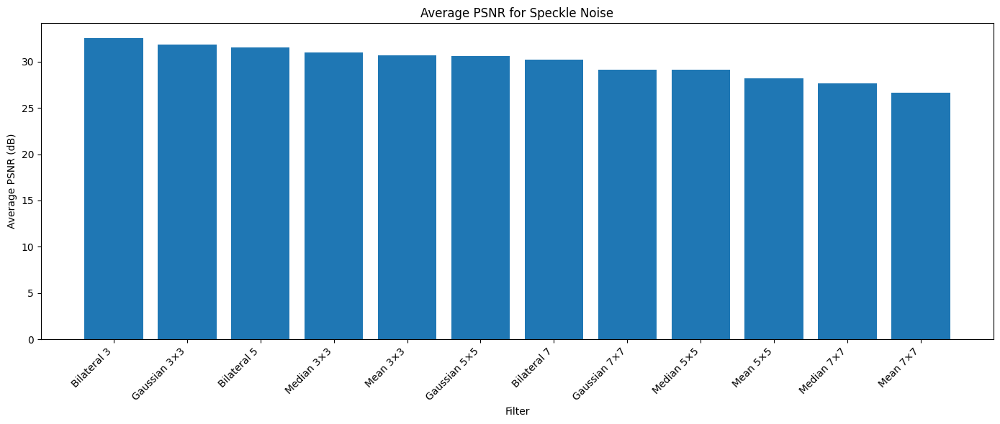

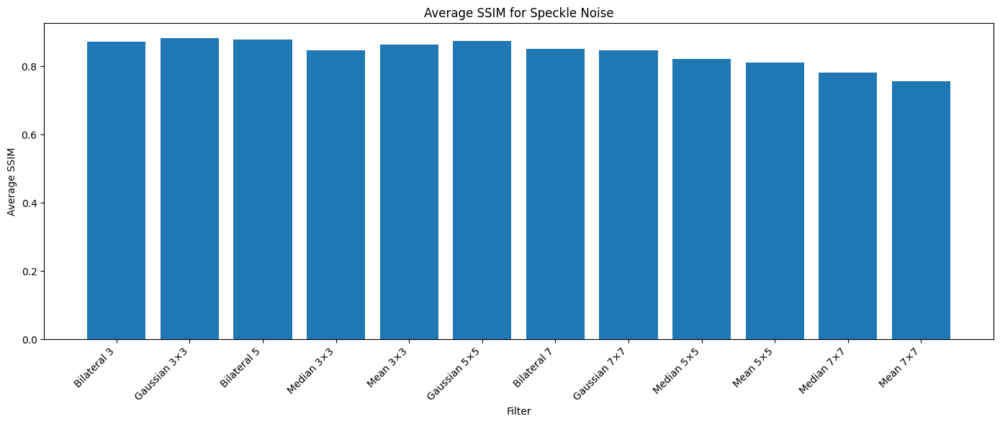

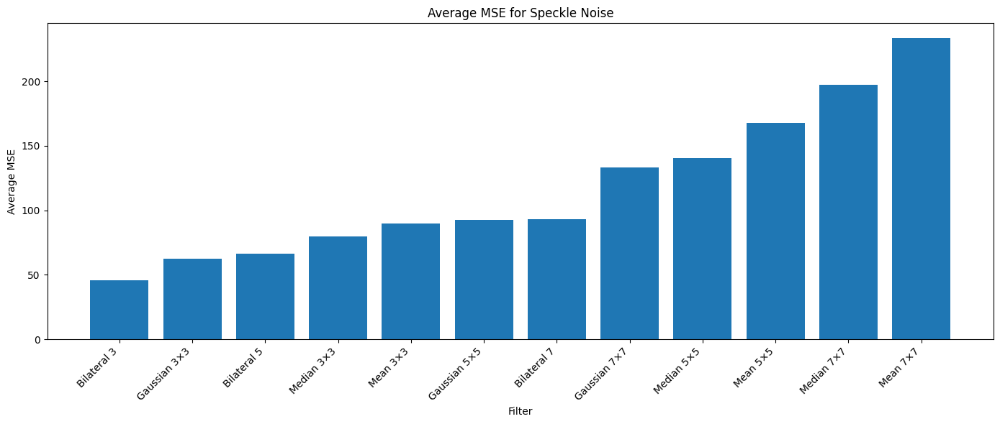

In [110]:
# PSNR Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_speckle.index, average_speckle["PSNR"])
plt.xlabel("Filter")
plt.ylabel("Average PSNR (dB)")
plt.title("Average PSNR for Speckle Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


# SSIM Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_speckle.index, average_speckle["SSIM"])
plt.xlabel("Filter")
plt.ylabel("Average SSIM")
plt.title("Average SSIM for Speckle Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


# MSE Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_speckle.index, average_speckle["MSE"])
plt.xlabel("Filter")
plt.ylabel("Average MSE")
plt.title("Average MSE for Speckle Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()

## 30. Speckle Noise Results

The results show that the Bilateral 3 filter achieved the highest PSNR
and the lowest MSE, with a PSNR of 32.5218 dB and an MSE of 45.5264.

The Gaussian 3×3 filter achieved the highest SSIM value of 0.8826,
showing the highest structural similarity with the original images.

Overall, smaller filter sizes performed better for Speckle noise in this
experiment. The best filter depends on the evaluation metric used.

## 31. Multiplicative Noise Evaluation

In [111]:
# Select Multiplicative Noise

multiplicative_path = base_path + "/noises/multiplicative"

filenames = os.listdir(original_folder)

results_multiplicative = []


# Process All Images

for i, filename in enumerate(filenames):

    original_img = cv2.imread(
        original_folder + "/" + filename,
        cv2.IMREAD_GRAYSCALE
    )

    noisy_img = cv2.imread(
        multiplicative_path + "/" + filename,
        cv2.IMREAD_GRAYSCALE
    )

    if original_img is None or noisy_img is None:
        continue


    # Apply Filters

    filters_multiplicative = {
        "Mean 3×3": cv2.blur(noisy_img, (3, 3)),
        "Mean 5×5": cv2.blur(noisy_img, (5, 5)),
        "Mean 7×7": cv2.blur(noisy_img, (7, 7)),

        "Gaussian 3×3": cv2.GaussianBlur(noisy_img, (3, 3), 0),
        "Gaussian 5×5": cv2.GaussianBlur(noisy_img, (5, 5), 0),
        "Gaussian 7×7": cv2.GaussianBlur(noisy_img, (7, 7), 0),

        "Median 3×3": cv2.medianBlur(noisy_img, 3),
        "Median 5×5": cv2.medianBlur(noisy_img, 5),
        "Median 7×7": cv2.medianBlur(noisy_img, 7),

        "Bilateral 3": cv2.bilateralFilter(noisy_img, 3, 75, 75),
        "Bilateral 5": cv2.bilateralFilter(noisy_img, 5, 75, 75),
        "Bilateral 7": cv2.bilateralFilter(noisy_img, 7, 75, 75)
    }


    # Calculate Metrics

    for name, filtered_img in filters_multiplicative.items():

        mse = mean_squared_error(
            original_img,
            filtered_img
        )

        psnr = peak_signal_noise_ratio(
            original_img,
            filtered_img,
            data_range=255
        )

        ssim = structural_similarity(
            original_img,
            filtered_img,
            data_range=255
        )

        results_multiplicative.append([
            name,
            mse,
            psnr,
            ssim
        ])


    # Show Progress

    if (i + 1) % 25 == 0:
        print("Processed:", i + 1)


# Create Results Table

results_multiplicative_df = pd.DataFrame(
    results_multiplicative,
    columns=["Filter", "MSE", "PSNR", "SSIM"]
)


# Calculate Average Results

average_multiplicative = results_multiplicative_df.groupby(
    "Filter"
)[["MSE", "PSNR", "SSIM"]].mean()

average_multiplicative = average_multiplicative.sort_values(
    by="PSNR",
    ascending=False
)


# Find Best Filters

best_multiplicative_psnr = average_multiplicative["PSNR"].idxmax()
best_multiplicative_ssim = average_multiplicative["SSIM"].idxmax()
best_multiplicative_mse = average_multiplicative["MSE"].idxmin()


# Show Results

print("Evaluation completed.")
print("Images processed:", len(results_multiplicative_df) // 12)

display(average_multiplicative.round(4))

print("Best PSNR:", best_multiplicative_psnr)
print("Best SSIM:", best_multiplicative_ssim)
print("Best MSE:", best_multiplicative_mse)

Processed: 25
Processed: 50
Processed: 75
Processed: 100
Processed: 125
Processed: 150
Processed: 175
Processed: 200
Processed: 225
Processed: 250
Processed: 275
Processed: 300
Evaluation completed.
Images processed: 300


,MSE,PSNR,SSIM
Filter,,,
Gaussian 7×7,348.1988,23.9241,0.6766
Median 7×7,357.2812,23.8399,0.6322
Median 5×5,336.4874,23.8146,0.5926
Gaussian 5×5,347.2399,23.7227,0.6251
Mean 5×5,379.2376,23.5666,0.6442
Mean 7×7,422.0761,23.2481,0.6640
Bilateral 7,378.6543,23.2111,0.5790
Mean 3×3,385.6093,23.1223,0.5689
Gaussian 3×3,393.2902,22.9543,0.5587


Best PSNR: Gaussian 7×7
Best SSIM: Gaussian 7×7
Best MSE: Median 5×5


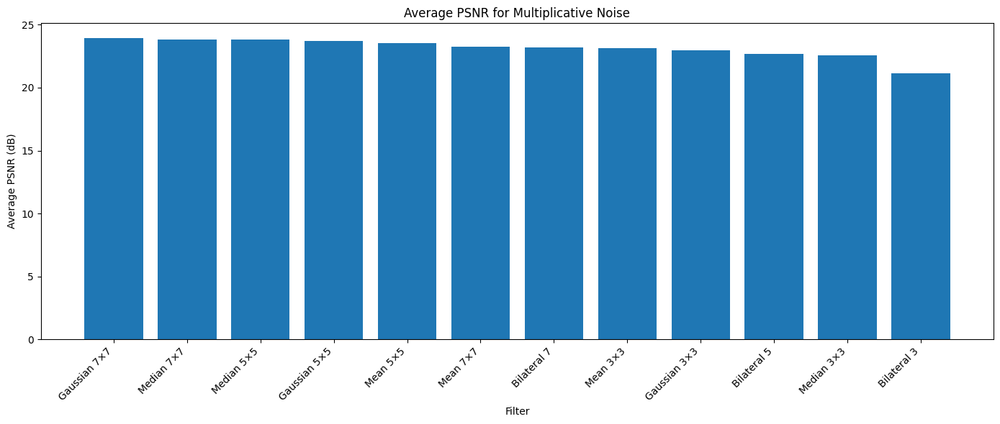

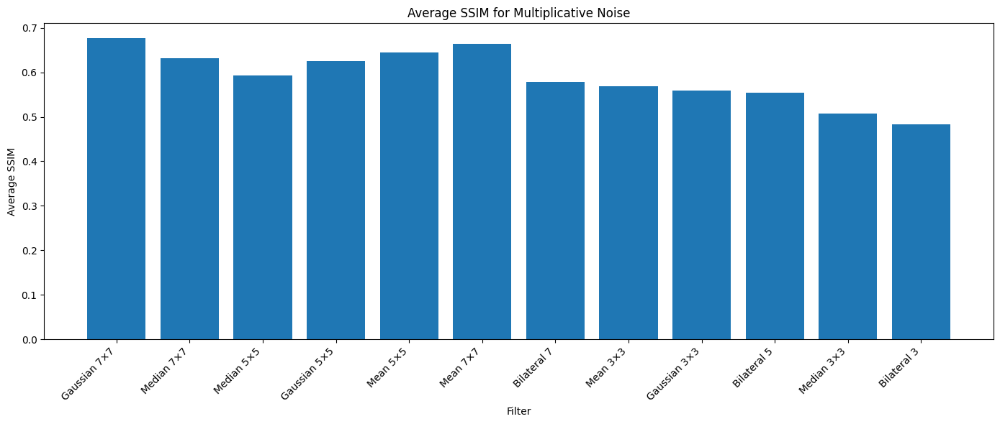

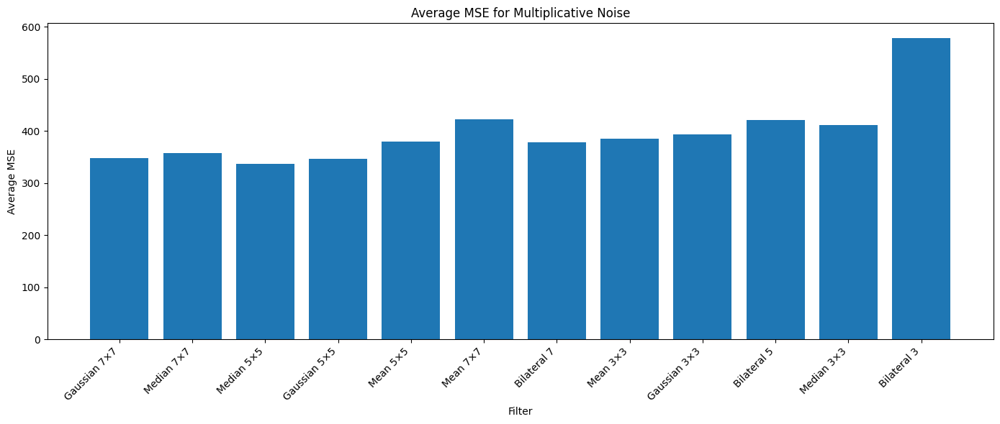

In [112]:
# PSNR Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_multiplicative.index, average_multiplicative["PSNR"])
plt.xlabel("Filter")
plt.ylabel("Average PSNR (dB)")
plt.title("Average PSNR for Multiplicative Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


# SSIM Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_multiplicative.index, average_multiplicative["SSIM"])
plt.xlabel("Filter")
plt.ylabel("Average SSIM")
plt.title("Average SSIM for Multiplicative Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


# MSE Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_multiplicative.index, average_multiplicative["MSE"])
plt.xlabel("Filter")
plt.ylabel("Average MSE")
plt.title("Average MSE for Multiplicative Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()

## 32.Multiplicative Noise Result

The results show that the Gaussian 7×7 filter achieved the highest PSNR
and SSIM values, with a PSNR of 23.9241 dB and an SSIM of 0.6766.

The Median 5×5 filter achieved the lowest MSE value of 336.4874.

Overall, the Gaussian 7×7 filter performed best according to PSNR and SSIM,
while the Median 5×5 filter produced the lowest MSE.

## 33.Quantization Noise Evaluation

In [113]:
# Select Quantization Noise

quantization_path = base_path + "/noises/quantization"

filenames = os.listdir(original_folder)

results_quantization = []


# Process All Images

for i, filename in enumerate(filenames):

    original_img = cv2.imread(
        original_folder + "/" + filename,
        cv2.IMREAD_GRAYSCALE
    )

    noisy_img = cv2.imread(
        quantization_path + "/" + filename,
        cv2.IMREAD_GRAYSCALE
    )

    if original_img is None or noisy_img is None:
        continue


    # Apply Filters

    filters_quantization = {
        "Mean 3×3": cv2.blur(noisy_img, (3, 3)),
        "Mean 5×5": cv2.blur(noisy_img, (5, 5)),
        "Mean 7×7": cv2.blur(noisy_img, (7, 7)),

        "Gaussian 3×3": cv2.GaussianBlur(noisy_img, (3, 3), 0),
        "Gaussian 5×5": cv2.GaussianBlur(noisy_img, (5, 5), 0),
        "Gaussian 7×7": cv2.GaussianBlur(noisy_img, (7, 7), 0),

        "Median 3×3": cv2.medianBlur(noisy_img, 3),
        "Median 5×5": cv2.medianBlur(noisy_img, 5),
        "Median 7×7": cv2.medianBlur(noisy_img, 7),

        "Bilateral 3": cv2.bilateralFilter(noisy_img, 3, 75, 75),
        "Bilateral 5": cv2.bilateralFilter(noisy_img, 5, 75, 75),
        "Bilateral 7": cv2.bilateralFilter(noisy_img, 7, 75, 75)
    }


    # Calculate Metrics

    for name, filtered_img in filters_quantization.items():

        mse = mean_squared_error(
            original_img,
            filtered_img
        )

        psnr = peak_signal_noise_ratio(
            original_img,
            filtered_img,
            data_range=255
        )

        ssim = structural_similarity(
            original_img,
            filtered_img,
            data_range=255
        )

        results_quantization.append([
            name,
            mse,
            psnr,
            ssim
        ])


    # Show Progress

    if (i + 1) % 25 == 0:
        print("Processed:", i + 1)


# Create Results Table

results_quantization_df = pd.DataFrame(
    results_quantization,
    columns=["Filter", "MSE", "PSNR", "SSIM"]
)


# Calculate Average Results

average_quantization = results_quantization_df.groupby(
    "Filter"
)[["MSE", "PSNR", "SSIM"]].mean()

average_quantization = average_quantization.sort_values(
    by="PSNR",
    ascending=False
)


# Find Best Filters

best_quantization_psnr = average_quantization["PSNR"].idxmax()
best_quantization_ssim = average_quantization["SSIM"].idxmax()
best_quantization_mse = average_quantization["MSE"].idxmin()


# Show Results

print("Evaluation completed.")
print("Images processed:", len(results_quantization_df) // 12)

display(average_quantization.round(4))

print("Best PSNR:", best_quantization_psnr)
print("Best SSIM:", best_quantization_ssim)
print("Best MSE:", best_quantization_mse)

Processed: 25
Processed: 50
Processed: 75
Processed: 100
Processed: 125
Processed: 150
Processed: 175
Processed: 200
Processed: 225
Processed: 250
Processed: 275
Processed: 300
Evaluation completed.
Images processed: 300


,MSE,PSNR,SSIM
Filter,,,
Bilateral 3,301.6404,23.4380,0.8338
Gaussian 3×3,309.6129,23.3661,0.8287
Bilateral 5,328.7012,23.0978,0.8072
Mean 3×3,338.7664,23.0379,0.8037
Median 3×3,340.2331,23.0045,0.7809
Gaussian 5×5,342.6332,22.9911,0.8042
Bilateral 7,345.1106,22.9310,0.7758
Gaussian 7×7,384.0622,22.5758,0.7709
Median 5×5,410.5473,22.3363,0.7232


Best PSNR: Bilateral 3
Best SSIM: Bilateral 3
Best MSE: Bilateral 3


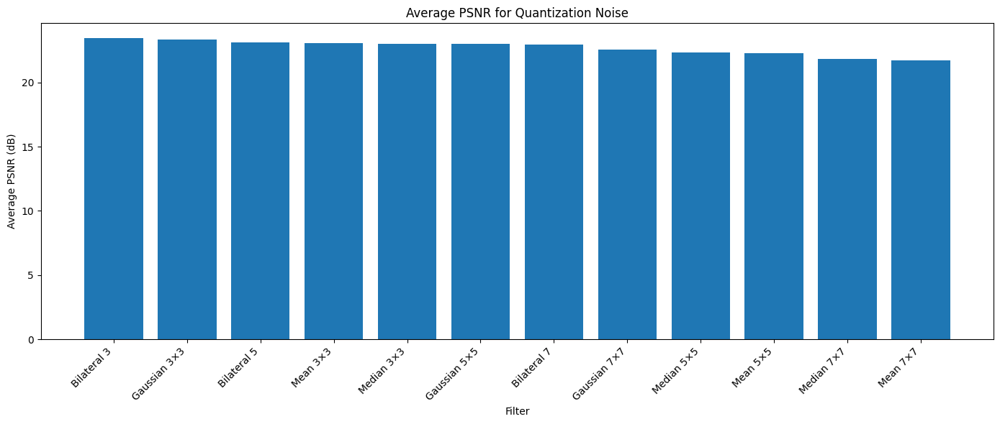

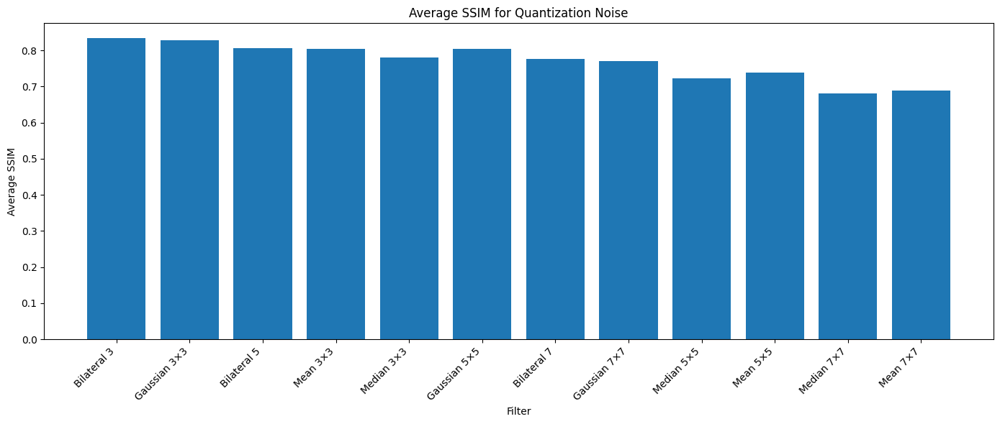

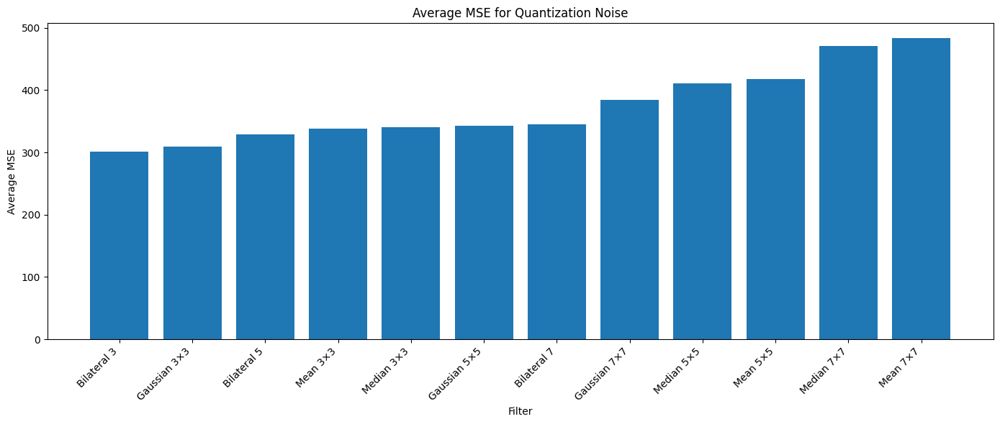

In [114]:
# PSNR Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_quantization.index, average_quantization["PSNR"])
plt.xlabel("Filter")
plt.ylabel("Average PSNR (dB)")
plt.title("Average PSNR for Quantization Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


# SSIM Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_quantization.index, average_quantization["SSIM"])
plt.xlabel("Filter")
plt.ylabel("Average SSIM")
plt.title("Average SSIM for Quantization Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()


# MSE Comparison

plt.figure(figsize=(14, 6))
plt.bar(average_quantization.index, average_quantization["MSE"])
plt.xlabel("Filter")
plt.ylabel("Average MSE")
plt.title("Average MSE for Quantization Noise")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()
plt.close()

## 34.Quantization Noise Result

The results show that the Bilateral 3 filter achieved the best performance
across all three evaluation metrics.

It achieved the highest PSNR of 23.4380 dB, the highest SSIM of 0.8338,
and the lowest MSE of 301.6404.

Overall, the Bilateral 3 filter provided the best results for Quantization
noise in this experiment.

## 35.Final Comparison

In [116]:
comparison = pd.concat(
    {
        "Gaussian": average_results,
        "Salt & Pepper": average_sp,
        "Poisson": average_poisson,
        "JPEG": average_jpeg,
        "Speckle": average_speckle,
        "Multiplicative": average_multiplicative,
        "Quantization": average_quantization
    },
    names=["Noise", "Filter"]
)

display(comparison.round(4))

MSE     PSNR    SSIM
Noise        Filter                                 
Gaussian     Bilateral 5    86.0120  29.6269  0.7846
             Bilateral 7   105.6394  29.1584  0.7992
             Gaussian 3×3   95.4184  28.9880  0.7399
             Gaussian 5×5  113.6459  28.8527  0.7808
             Bilateral 3    89.2889  28.8438  0.6985
...                             ...      ...     ...
Quantization Gaussian 7×7  384.0622  22.5758  0.7709
             Median 5×5    410.5473  22.3363  0.7232
             Mean 5×5      417.7796  22.2806  0.7397
             Median 7×7    470.7767  21.8488  0.6806
             Mean 7×7      483.2649  21.7444  0.6890

[84 rows x 3 columns]

In [118]:
# Best Filter for Each Noise

best_summary = []

noise_results = {
    "Gaussian": average_results,
    "Salt & Pepper": average_sp,
    "Poisson": average_poisson,
    "JPEG": average_jpeg,
    "Speckle": average_speckle,
    "Multiplicative": average_multiplicative,
    "Quantization": average_quantization
}

for noise, df in noise_results.items():

    best_summary.append([
        noise,
        df["PSNR"].idxmax(),
        df["PSNR"].max(),
        df["SSIM"].idxmax(),
        df["SSIM"].max(),
        df["MSE"].idxmin(),
        df["MSE"].min()
    ])

best_summary_df = pd.DataFrame(
    best_summary,
    columns=[
        "Noise",
        "Best PSNR Filter",
        "Best PSNR",
        "Best SSIM Filter",
        "Best SSIM",
        "Best MSE Filter",
        "Best MSE"
    ]
)

display(best_summary_df.round(4))

,Noise,Best PSNR Filter,Best PSNR,Best SSIM Filter,Best SSIM,Best MSE Filter,Best MSE
0,Gaussian,Bilateral 5,29.6269,Bilateral 7,0.7992,Bilateral 5,86.0120
1,Salt & Pepper,Median 3×3,32.9511,Median 3×3,0.9202,Median 3×3,68.8100
2,Poisson,Bilateral 3,33.3388,Gaussian 3×3,0.9006,Bilateral 3,38.6359
3,JPEG,Bilateral 3,33.6822,Bilateral 3,0.9243,Bilateral 3,44.0468
4,Speckle,Bilateral 3,32.5218,Gaussian 3×3,0.8826,Bilateral 3,45.5264
5,Multiplicative,Gaussian 7×7,23.9241,Gaussian 7×7,0.6766,Median 5×5,336.4874
6,Quantization,Bilateral 3,23.4380,Bilateral 3,0.8338,Bilateral 3,301.6404


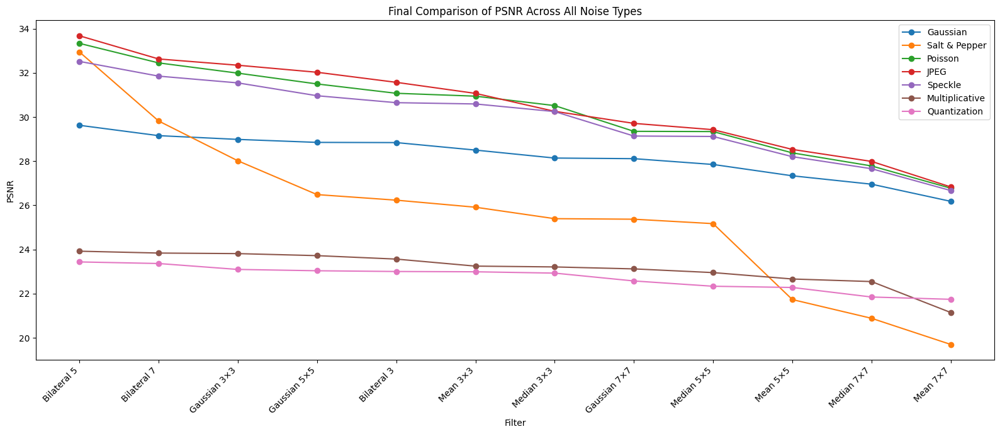

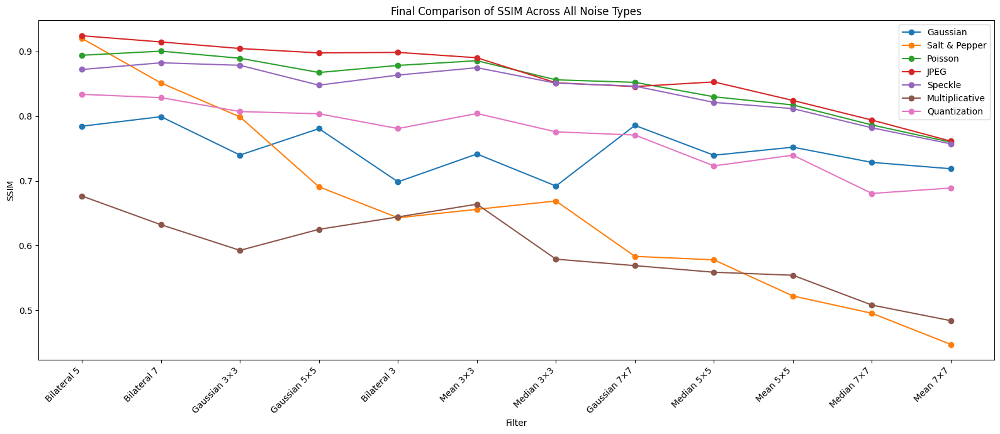

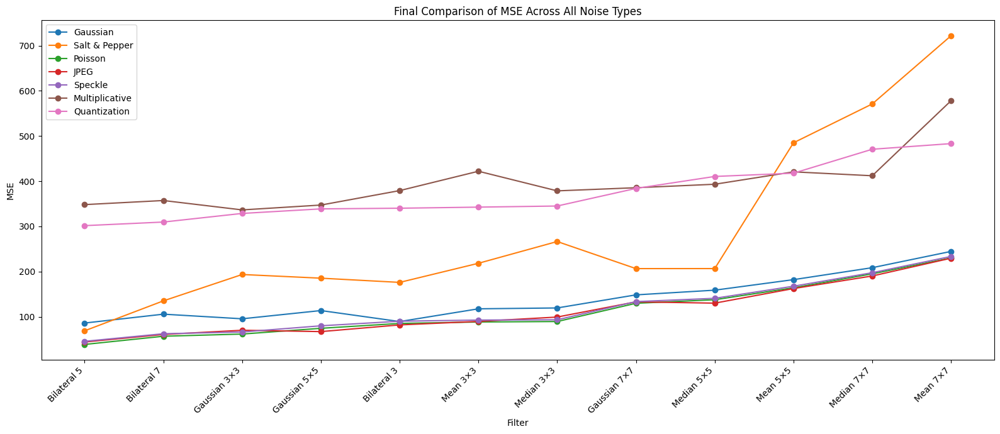

In [119]:
# Final Comparison Charts

metrics = ["PSNR", "SSIM", "MSE"]

for metric in metrics:

    plt.figure(figsize=(16, 7))

    for noise, df in noise_results.items():
        plt.plot(
            df[metric].values,
            marker="o",
            label=noise
        )

    plt.xticks(
        range(len(average_results.index)),
        average_results.index,
        rotation=45,
        ha="right"
    )

    plt.xlabel("Filter")
    plt.ylabel(metric)
    plt.title(f"Final Comparison of {metric} Across All Noise Types")
    plt.legend()
    plt.tight_layout()
    plt.show()
    plt.close()

## Final Noise Denoising Summary

The experiment evaluated four image filters with three different kernel sizes
on seven types of noise: Gaussian, Salt and Pepper, Poisson, JPEG, Speckle,
Multiplicative, and Quantization.

The results were evaluated using three metrics: MSE, PSNR, and SSIM.

The results show that filter performance depends on the type of noise and the
kernel size. No single filter achieved the best result for all noise types
and all evaluation metrics.

For Gaussian noise, the Bilateral filter and Gaussian filter achieved strong
results, while Median filtering performed better for Salt and Pepper noise.
For Poisson, JPEG, Speckle, and Quantization noise, small kernel sizes
generally produced better results. For Multiplicative noise, larger Gaussian
filtering provided better PSNR and SSIM results in this experiment.

Overall, the comparison shows that choosing an appropriate filter depends on
the characteristics of the noise. The experimental results also demonstrate
that increasing the kernel size does not always improve image quality, since
larger kernels can remove noise while also reducing image details.

The MSE, PSNR, and SSIM results provide different aspects of image quality,
so the performance of a filter should be considered using multiple metrics
rather than a single measure.

# Part 2 — Morphological Image Processing

## 1.Load, Prepare Image & Create Structuring Element

In [120]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Find Kaggle input directories
print("Available datasets:")

for item in os.listdir("/kaggle/input"):
    print("-", item)

# Automatically select the first dataset folder
dataset_path = "/kaggle/input/" + os.listdir("/kaggle/input")[0]

print("\nDataset path:", dataset_path)

# Show folders inside the dataset
print("\nDataset contents:")

for item in os.listdir(dataset_path):
    print("-", item)

# Find a folder containing original images
original_folder = None

for root, dirs, files in os.walk(dataset_path):
    image_files = [
        f for f in files
        if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp"))
    ]

    if len(image_files) > 0:
        original_folder = root
        break

print("\nImage folder:", original_folder)

# Get the first image
filename = os.listdir(original_folder)[0]

original = cv2.imread(
    os.path.join(original_folder, filename),
    cv2.IMREAD_GRAYSCALE
)

print("Image:", filename)
print("Image shape:", original.shape)

# Convert grayscale image to binary
_, binary = cv2.threshold(
    original,
    127,
    255,
    cv2.THRESH_BINARY
)

# Create a 3×3 structuring element
kernel = np.ones((3, 3), np.uint8)

print("Binary image created successfully.")
print("Structuring element shape:", kernel.shape)

Available datasets:
- datasets

Dataset path: /kaggle/input/datasets

Dataset contents:
- goutham1208

Image folder: /kaggle/input/datasets/goutham1208/multi-noises-for-image-denoising/dataset/noises/salt_and_pepper
Image: 5237865515_8bbc650900_c.jpg
Image shape: (512, 512)
Binary image created successfully.
Structuring element shape: (3, 3)


##  2. Apply and Visualize Morphological Operations


In [ ]:
# Morphological Denoising on All 300 Salt and Pepper Images + Evaluation

import os
import cv2
import numpy as np
import pandas as pd
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio, structural_similarity

# Dataset paths
dataset_path = "/kaggle/input/datasets/goutham1208/multi-noises-for-image-denoising/dataset"

original_folder = os.path.join(dataset_path, "original")
noisy_folder = os.path.join(dataset_path, "noises", "salt_and_pepper")

# Get common image filenames
original_files = {
    f for f in os.listdir(original_folder)
    if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp"))
}

noisy_files = {
    f for f in os.listdir(noisy_folder)
    if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp"))
}

filenames = sorted(original_files.intersection(noisy_files))

print("Number of common images:", len(filenames))

# Structuring element sizes
kernel_sizes = [3, 5, 7]

# Store results
results = []

# Process all images
for filename in filenames:

    original = cv2.imread(
        os.path.join(original_folder, filename),
        cv2.IMREAD_GRAYSCALE
    )

    noisy = cv2.imread(
        os.path.join(noisy_folder, filename),
        cv2.IMREAD_GRAYSCALE
    )

    if original is None or noisy is None:
        continue

    for size in kernel_sizes:

        kernel = np.ones((size, size), np.uint8)

        # Erosion
        erosion = cv2.erode(
            noisy,
            kernel,
            iterations=1
        )

        # Dilation
        dilation = cv2.dilate(
            noisy,
            kernel,
            iterations=1
        )

        # Opening
        opening = cv2.morphologyEx(
            noisy,
            cv2.MORPH_OPEN,
            kernel
        )

        # Closing
        closing = cv2.morphologyEx(
            noisy,
            cv2.MORPH_CLOSE,
            kernel
        )

        # Opening followed by Closing
        opening_closing = cv2.morphologyEx(
            opening,
            cv2.MORPH_CLOSE,
            kernel
        )

        methods = {
            f"Erosion {size}×{size}": erosion,
            f"Dilation {size}×{size}": dilation,
            f"Opening {size}×{size}": opening,
            f"Closing {size}×{size}": closing,
            f"Opening+Closing {size}×{size}": opening_closing
        }

        # Calculate metrics
        for method, filtered in methods.items():

            mse = mean_squared_error(
                original,
                filtered
            )

            psnr = peak_signal_noise_ratio(
                original,
                filtered,
                data_range=255
            )

            ssim = structural_similarity(
                original,
                filtered,
                data_range=255
            )

            results.append([
                method,
                mse,
                psnr,
                ssim
            ])

# Convert results to DataFrame
morphological_results = pd.DataFrame(
    results,
    columns=["Filter", "MSE", "PSNR", "SSIM"]
)

# Calculate average performance
average_morphological = (
    morphological_results
    .groupby("Filter")[["MSE", "PSNR", "SSIM"]]
    .mean()
    .sort_values("PSNR", ascending=False)
)

print("\nAverage Morphological Filtering Results:")
display(average_morphological.round(4))


Average Morphological Filtering Results:


,MSE,PSNR,SSIM
Filter,,,
Opening+Closing 3×3,175.5754,27.9885,0.8544
Opening+Closing 5×5,515.9191,22.6995,0.7347
Opening 3×3,646.8591,20.5215,0.5550
Closing 3×3,866.8743,19.0837,0.4999
Opening+Closing 7×7,1352.7616,17.6703,0.6099
Opening 5×5,1346.1334,17.3778,0.4547
Closing 5×5,1779.1433,15.9997,0.4165
Opening 7×7,3023.9093,13.8048,0.3534
Erosion 3×3,3746.8849,12.8739,0.2775


## 3. Morphological Denoising on All 300 Images + Evaluation

In [123]:
# Morphological Denoising on All 300 Images + Evaluation

import os
import cv2
import numpy as np
import pandas as pd
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio, structural_similarity

# Dataset paths
dataset_path = "/kaggle/input/datasets/goutham1208/multi-noises-for-image-denoising/dataset"

original_folder = os.path.join(dataset_path, "original")
noisy_folder = os.path.join(dataset_path, "noises", "salt_and_pepper")

# Get common image filenames
original_files = {
    f for f in os.listdir(original_folder)
    if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp"))
}

noisy_files = {
    f for f in os.listdir(noisy_folder)
    if f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp"))
}

filenames = sorted(original_files.intersection(noisy_files))

print("Number of common images:", len(filenames))

# Structuring element sizes
kernel_sizes = [3, 5, 7]

# Store results
results = []

# Process all images
for filename in filenames:

    original = cv2.imread(
        os.path.join(original_folder, filename),
        cv2.IMREAD_GRAYSCALE
    )

    noisy = cv2.imread(
        os.path.join(noisy_folder, filename),
        cv2.IMREAD_GRAYSCALE
    )

    if original is None or noisy is None:
        continue

    for size in kernel_sizes:

        kernel = np.ones((size, size), np.uint8)

        # Morphological Opening
        opening = cv2.morphologyEx(
            noisy,
            cv2.MORPH_OPEN,
            kernel
        )

        # Morphological Closing
        closing = cv2.morphologyEx(
            noisy,
            cv2.MORPH_CLOSE,
            kernel
        )

        # Opening followed by Closing
        opening_closing = cv2.morphologyEx(
            opening,
            cv2.MORPH_CLOSE,
            kernel
        )

        # Calculate metrics
        for method, filtered in [
            (f"Opening {size}×{size}", opening),
            (f"Closing {size}×{size}", closing),
            (f"Opening+Closing {size}×{size}", opening_closing)
        ]:

            mse = mean_squared_error(original, filtered)

            psnr = peak_signal_noise_ratio(
                original,
                filtered,
                data_range=255
            )

            ssim = structural_similarity(
                original,
                filtered,
                data_range=255
            )

            results.append({
                "Filter": method,
                "MSE": mse,
                "PSNR": psnr,
                "SSIM": ssim
            })

# Convert results to DataFrame
morphological_results = pd.DataFrame(results)

# Calculate average performance
average_morphological = (
    morphological_results
    .groupby("Filter")[["MSE", "PSNR", "SSIM"]]
    .mean()
    .sort_values("PSNR", ascending=False)
)

print("\nAverage Morphological Filtering Results:")
display(average_morphological.round(4))

Number of common images: 300

Average Morphological Filtering Results:


,MSE,PSNR,SSIM
Filter,,,
Opening+Closing 3×3,175.5754,27.9885,0.8544
Opening+Closing 5×5,515.9191,22.6995,0.7347
Opening 3×3,646.8591,20.5215,0.5550
Closing 3×3,866.8743,19.0837,0.4999
Opening+Closing 7×7,1352.7616,17.6703,0.6099
Opening 5×5,1346.1334,17.3778,0.4547
Closing 5×5,1779.1433,15.9997,0.4165
Opening 7×7,3023.9093,13.8048,0.3534
Closing 7×7,4160.0082,12.2801,0.3290


## 4. Best Morphological Results


In [124]:
best_mse = average_morphological["MSE"].idxmin()
best_psnr = average_morphological["PSNR"].idxmax()
best_ssim = average_morphological["SSIM"].idxmax()

print("Best MSE :", best_mse)
print("Best PSNR:", best_psnr)
print("Best SSIM:", best_ssim)

print("\nBest Morphological Configuration:")

best_method = "Opening+Closing 3×3"

display(
    average_morphological.loc[[best_method]].round(4)
)

Best MSE : Opening+Closing 3×3
Best PSNR: Opening+Closing 3×3
Best SSIM: Opening+Closing 3×3

Best Morphological Configuration:


,MSE,PSNR,SSIM
Filter,,,
Opening+Closing 3×3,175.5754,27.9885,0.8544


## 5. Morphological Filtering Results

Morphological filtering was evaluated on all 300 Salt and Pepper noise images using Erosion, Dilation, Opening, Closing, and Opening followed by Closing with 3×3, 5×5, and 7×7 structuring elements.

Among all tested morphological configurations, **Opening + Closing with a 3×3 structuring element** achieved the best performance across all three evaluation metrics.

The method achieved an average MSE of **175.5754**, an average PSNR of **27.9885 dB**, and an average SSIM of **0.8544**.

The results also show that increasing the structuring element size generally reduced the denoising performance. In particular, the 5×5 and 7×7 configurations produced higher MSE and lower PSNR and SSIM values compared with the 3×3 configuration.

Overall, the results indicate that combining Opening and Closing with a small 3×3 structuring element was the most effective morphological approach for the Salt and Pepper noise images in this experiment.

## 6. Comparison: Part 1 vs Part 2 for Salt and Pepper Noise

In [126]:
# Best morphological method from Part 2
morphological_best = average_morphological.loc[
    "Opening+Closing 3×3"
]

# Results from Part 1
comparison_salt_pepper = pd.DataFrame({
    "Method": [
        "Bilateral 3",
        "Gaussian 3×3",
        "Morphological Opening+Closing 3×3"
    ],
    "MSE": [
        38.6359,
        56.8017,
        morphological_best["MSE"]
    ],
    "PSNR": [
        33.3388,
        32.4533,
        morphological_best["PSNR"]
    ],
    "SSIM": [
        0.8942,
        0.9006,
        morphological_best["SSIM"]
    ]
})

print("Salt and Pepper Noise - Part 1 vs Part 2")

display(
    comparison_salt_pepper.round(4)
)

Salt and Pepper Noise - Part 1 vs Part 2


,Method,MSE,PSNR,SSIM
0,Bilateral 3,38.6359,33.3388,0.8942
1,Gaussian 3×3,56.8017,32.4533,0.9006
2,Morphological Opening+Closing 3×3,175.5754,27.9885,0.8544


## 7. Final Conclusion — Part 2

The morphological filtering methods were evaluated on 300 images affected by Salt and Pepper noise.

Among the tested morphological configurations, **Opening + Closing with a 3×3 structuring element** achieved the best morphological results across all three evaluation metrics, with an MSE of **175.5754**, a PSNR of **27.9885 dB**, and an SSIM of **0.8544**.

The results were then compared with the best spatial filtering results obtained in Part 1. The **Bilateral 3** filter achieved a lower MSE of **38.6359** and a higher PSNR of **33.3388 dB**, while the **Gaussian 3×3** filter achieved an SSIM of **0.9006**.

Therefore, for the tested Salt and Pepper noise dataset, the spatial filters from Part 1 produced better quantitative results than the best morphological configuration. However, morphological processing successfully demonstrated the use of Erosion, Dilation, Opening, and Closing operations for image denoising.

Overall, the experiment shows that the effectiveness of a denoising method depends on the noise type, the filtering operation, the structuring element size, and the evaluation metric.